In [88]:
import os

import scanpy as sc
import seaborn as sns

In [89]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [243]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import scipy.sparse as sp
from typing import Dict, List, Optional, Tuple


# ── Shared publication style ──────────────────────────────────────────────────

_PUB_RC = {
    "font.family": "sans-serif",
    "axes.titlesize": 16,
    "axes.labelsize": 13,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,
    "legend.fontsize": 11,
    "legend.title_fontsize": 13,
    "savefig.dpi": 300,
    "savefig.bbox": "tight",
}

_BG_COLOR = "#D9D9D9"   # color for background cells on UMAP
_PT = 3                 # default scatter point size

_LEGEND_FRAME = dict(facecolor="white", edgecolor="#444444", linewidth=0.8)
_LABEL_BBOX   = dict(facecolor="white", edgecolor="#444444", linewidth=0.8,
                     boxstyle="round,pad=0.25", alpha=0.3)


def _todense(X):
    return X.toarray() if sp.issparse(X) else np.asarray(X)


def _wrap_label(label: str, max_len: int) -> str:
    """Replace spaces with newlines when label exceeds max_len characters."""
    if len(label) <= max_len:
        return label
    return label.replace(" ", "\n")


def _prettify_label(label: str) -> str:
    """Replace underscores with spaces."""
    return label.replace("_", " ")


def _style_legend(
    ax: plt.Axes,
    max_label_len: Optional[int] = None,
    label_map: Optional[Dict[str, str]] = None,
) -> None:
    """
    Style legend labels after scanpy renders the plot.

    - "right margin" mode: whites out the legend frame and adds a dark border.
    - "on data" mode: scanpy places ax.text() annotations instead of a legend,
      so we add a white bbox to each text object directly.

    Must be called before _umap_style() so that ax.texts only contains
    scanpy's cluster labels, not the axis arrow annotations.
    """
    leg = ax.get_legend()
    if leg is not None:
        # ── right margin legend ───────────────────────────────────────────
        frame = leg.get_frame()
        frame.set_facecolor(_LEGEND_FRAME["facecolor"])
        frame.set_edgecolor(_LEGEND_FRAME["edgecolor"])
        frame.set_linewidth(_LEGEND_FRAME["linewidth"])
        for text in leg.get_texts():
            display = label_map.get(text.get_text(), text.get_text()) if label_map else text.get_text()
            if max_label_len is not None:
                display = _wrap_label(display, max_label_len)
            text.set_text(display)
    else:
        # ── on-data text annotations ──────────────────────────────────────
        for text in ax.texts:
            display = label_map.get(text.get_text(), text.get_text()) if label_map else text.get_text()
            if max_label_len is not None:
                display = _wrap_label(display, max_label_len)
            text.set_text(display)
            text.set_bbox(_LABEL_BBOX)


def _umap_style(ax: plt.Axes, title: str = "") -> None:
    """Strip spines/ticks, set bold title, and draw minimal UMAP arrows."""
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")
    for s in ax.spines.values():
        s.set_visible(False)
    if title:
        ax.set_title(title, fontsize=16, fontweight="bold", pad=10)

    x0, x1 = ax.get_xlim()
    y0, y1 = ax.get_ylim()
    lx = (x1 - x0) * 0.13
    ly = (y1 - y0) * 0.13
    pad_x = (x1 - x0) * 0.025
    pad_y = (y1 - y0) * 0.025
    akw = dict(arrowstyle="->", color="black", lw=1.5)
    ax.annotate("", xy=(x0 + lx, y0 - pad_y), xytext=(x0, y0 - pad_y),
                arrowprops=akw, annotation_clip=False)
    ax.annotate("", xy=(x0 - pad_x, y0 + ly), xytext=(x0 - pad_x, y0),
                arrowprops=akw, annotation_clip=False)
    ax.text(x0 + lx / 2, y0 - pad_y * 2.8, "UMAP1",
            ha="center", va="top", fontsize=11, clip_on=False)
    ax.text(x0 - pad_x * 2.8, y0 + ly / 2, "UMAP2",
            ha="right", va="center", fontsize=11, rotation=90, clip_on=False)


def _set_obs_colors(adata, col: str, color_dict: Dict[str, str]) -> Optional[list]:
    """
    Temporarily write per-category colors into adata.uns so scanpy picks them up.
    Returns the previous value of adata.uns[key] (or None) for restoration.
    """
    adata.obs[col] = adata.obs[col].astype("category")
    uns_key = f"{col}_colors"
    saved = adata.uns.get(uns_key)
    cats = adata.obs[col].cat.categories.tolist()
    adata.uns[uns_key] = [color_dict.get(ct, _BG_COLOR) for ct in cats]
    return saved


def _restore_obs_colors(adata, col: str, saved) -> None:
    uns_key = f"{col}_colors"
    if saved is None:
        adata.uns.pop(uns_key, None)
    else:
        adata.uns[uns_key] = saved


# ── Individual plot functions ─────────────────────────────────────────────────

def plot_umap_celltypes(
    adata,
    celltype_col: str,
    celltype_colors: Dict[str, str],
    save_path: str,
    title: str = "Cell types",
    umap_key: str = "X_umap",
    point_size: float = _PT,
    figsize: Tuple[float, float] = (8, 7),
    legend_loc: str = "right margin",
    max_label_len: Optional[int] = 10,
    legend_fontsize: int = 13,
    legend_fontoutline: int = 2,
    prettify_labels: Optional[List[str]] = None,
    label_map: Optional[Dict[str, str]] = None,
) -> plt.Figure:
    """
    UMAP colored by discrete cell type, rendered via scanpy (add_outline=True).

    Parameters
    ----------
    adata : AnnData
    celltype_col : str
        adata.obs column containing cell type labels.
    celltype_colors : dict
        {cell_type_label: hex_color}. Labels absent from this dict are
        drawn in the background color.
    save_path : str
        Output file path (.pdf / .png / .svg …).
    title : str
    umap_key : str
        Key in adata.obsm for 2-D UMAP coordinates.
    point_size : float
        Scatter marker size (same units as matplotlib `s`).
    figsize : (w, h) in inches.
    legend_loc : str
        Scanpy legend placement: "right margin", "on data", or None.
    max_label_len : int or None
        Labels longer than this many characters have spaces replaced with
        newlines. Set to None to disable wrapping.
    prettify_labels : list of str, optional
        Cell type names to auto-prettify: underscores replaced with spaces,
        long names wrapped at word boundaries. Ignored if label_map is given.
    label_map : dict, optional
        Explicit {raw_label: display_label} mapping. Takes priority over
        prettify_labels. Labels absent from the dict are shown unchanged.
    """
    basis = umap_key[2:] if umap_key.startswith("X_") else umap_key

    if label_map is None and prettify_labels is not None:
        label_map = {ct: _prettify_label(ct) for ct in prettify_labels}

    saved = _set_obs_colors(adata, celltype_col, celltype_colors)
    try:
        with plt.rc_context(_PUB_RC):
            fig, ax = plt.subplots(figsize=figsize)
            sc.pl.embedding(
                adata, basis=basis, color=celltype_col,
                ax=ax, show=False, frameon=False, title="",
                size=point_size, add_outline=True,
                na_color=_BG_COLOR,
                legend_loc=legend_loc,
                legend_fontsize=legend_fontsize,
                legend_fontoutline=legend_fontoutline,
            )
            _style_legend(ax, max_label_len, label_map)   # before _umap_style adds its own texts
            _umap_style(ax, title)
            fig.tight_layout()
            fig.savefig(save_path)
    finally:
        _restore_obs_colors(adata, celltype_col, saved)
    return fig



def plot_umap_condition(
    adata,
    condition_col: str,
    condition_colors: Dict[str, str],
    save_path: str,
    title: str = "Condition",
    umap_key: str = "X_umap",
    point_size: float = _PT,
    figsize: Tuple[float, float] = (8, 7),
    legend_loc: str = "right margin",
    max_label_len: Optional[int] = 10,
) -> plt.Figure:
    """
    UMAP colored by a discrete condition variable (e.g. Healthy / Unhealthy),
    rendered via scanpy (add_outline=True).

    Parameters
    ----------
    adata : AnnData
    condition_col : str
        adata.obs column with condition labels.
    condition_colors : dict
        {condition_label: hex_color}.
    save_path : str
    title : str
    umap_key : str
    point_size : float
    figsize : (w, h) in inches.
    legend_loc : str
        Scanpy legend placement: "right margin", "on data", or None.
    max_label_len : int or None
        Labels longer than this many characters have spaces replaced with
        newlines. Set to None to disable wrapping.
    """
    basis = umap_key[2:] if umap_key.startswith("X_") else umap_key
    saved = _set_obs_colors(adata, condition_col, condition_colors)
    try:
        with plt.rc_context(_PUB_RC):
            fig, ax = plt.subplots(figsize=figsize)
            sc.pl.embedding(
                adata, basis=basis, color=condition_col,
                ax=ax, show=False, frameon=False, title="",
                size=point_size, add_outline=True,
                na_color=_BG_COLOR,
                legend_loc=legend_loc,
                legend_fontsize=11,
                legend_fontoutline=2,
            )
            _style_legend(ax, max_label_len)   # before _umap_style adds its own texts
            _umap_style(ax, title)
            fig.tight_layout()
            fig.savefig(save_path)
    finally:
        _restore_obs_colors(adata, condition_col, saved)
    return fig


def plot_marker_violins(
    adata,
    celltype_col: str,
    marker_genes: Dict[str, List[str]],
    celltype_colors: Dict[str, str],
    save_path: str,
    celltype_order: Optional[List[str]] = None,
    layer: Optional[str] = None,
    row_height: float = 0.85,
    col_width: float = 0.9,
    x_rotation: int = 45,
    inner: str = "box",
    ylabelsize: int = 12,
    xlabelsize: int = 20,
    gene_fontsize: int = 20
) -> plt.Figure:
    """
    Stacked violin plot: one row per gene, cell types on the shared x-axis.

    Layout matches the publication style in the reference image:
    gene names on the right of each row, cell-type tick labels at the bottom,
    y-axis ticks on the left, and thicker horizontal lines between sections.

    Parameters
    ----------
    adata : AnnData
    celltype_col : str
        adata.obs column with cell type labels.
    marker_genes : dict
        {section_label: [gene1, gene2, ...]}. Genes are plotted top-to-bottom
        in section order; a thicker separator line is drawn between sections.
    celltype_colors : dict
        {cell_type_label: hex_color}. Controls both violin color and which
        cell types appear on the x-axis.
    save_path : str
    celltype_order : list, optional
        Left-to-right display order of cell types. Defaults to
        celltype_colors key order filtered to labels present in adata.
    layer : str, optional
        adata.layers key to pull expression from. Defaults to adata.X.
    row_height : float
        Height in inches of each gene row.
    col_width : float
        Width in inches per cell type column.
    x_rotation : int
        Rotation of cell-type tick labels on the x-axis.
    inner : str
        Seaborn violinplot `inner` argument: "box", "quart", or None.
    """
    # ── cell types and palette ────────────────────────────────────────────
    present = set(adata.obs[celltype_col].unique())
    if celltype_order is None:
        celltype_order = [ct for ct in celltype_colors if ct in present]

    # List of colors in the exact same order as celltype_order — more reliable
    # than a dict palette across seaborn versions, since index always aligns
    # with the `order` parameter.
    colors_ordered = [celltype_colors.get(ct, _BG_COLOR) for ct in celltype_order]

    # ── flatten genes, record section boundary row indices ────────────────
    gene_order: List[str] = []
    section_starts: List[int] = []          # row index where each section begins
    for section, genes in marker_genes.items():
        section_starts.append(len(gene_order))
        gene_order.extend(genes)

    missing = [g for g in gene_order if g not in adata.var_names]
    if missing:
        raise ValueError(f"Genes not found in adata.var_names: {missing}")

    # ── expression matrix ─────────────────────────────────────────────────
    mat = _todense(
        adata[:, gene_order].layers[layer] if layer else adata[:, gene_order].X
    )
    expr_df = pd.DataFrame(mat, index=adata.obs_names, columns=gene_order)
    expr_df[celltype_col] = adata.obs[celltype_col].values
    expr_df = expr_df[expr_df[celltype_col].isin(celltype_order)]
    
    # return expr_df

    # ── figure ────────────────────────────────────────────────────────────
    n_genes = len(gene_order)
    n_ct    = len(celltype_order)
    fig_w   = col_width * n_ct + 2.5     # left (y-ticks) + right (gene labels)
    fig_h   = row_height * n_genes + 1.4  # bottom (x-tick labels)

    with plt.rc_context(_PUB_RC):
        fig, axes = plt.subplots(
            n_genes, 1,
            figsize=(fig_w, fig_h),
            sharex=False,          # set manually — categorical axes can misbehave with sharex
            squeeze=False,
        )
        axes = axes[:, 0]

        fig.subplots_adjust(hspace=0.08, left=0.09, right=0.77, top=0.98, bottom=0.14)

        for row_i, gene in enumerate(gene_order):
            ax = axes[row_i]

            plot_df = (
                expr_df[[celltype_col, gene]]
                .copy()
                .rename(columns={celltype_col: "Cell type", gene: "Expression"})
            )
            # print(gene, plot_df.value_counts("Cell type"))
            sns.violinplot(
                data=plot_df, x="Cell type", y="Expression",
                palette=colors_ordered, order=celltype_order,
                inner=inner, linewidth=0.6, cut=0,
                density_norm="width", ax=ax,
            )

            # gene name on the right as the y-axis label
            ax.set_ylabel(gene, rotation=0, ha="left", va="center",
                          fontsize=gene_fontsize, fontstyle="italic", labelpad=6)
            ax.yaxis.set_label_position("right")

            # y-axis: 2 ticks max, left side only
            ax.yaxis.set_major_locator(plt.MaxNLocator(nbins=2, integer=False))
            ax.tick_params(axis="y", labelsize=ylabelsize, left=True, right=False)

            # spines
            ax.spines["top"].set_visible(False)
            ax.spines["right"].set_visible(False)
            ax.spines["left"].set_linewidth(0.4)
            ax.spines["left"].set_color("#aaaaaa")
            ax.spines["bottom"].set_linewidth(0.4)
            ax.spines["bottom"].set_color("#cccccc")

            # light horizontal grid
            ax.yaxis.grid(True, color="#ebebeb", linewidth=0.5, zorder=0)
            ax.set_axisbelow(True)
            ax.set_xlabel("")

            # x-axis labels: only on the bottom row
            if row_i < n_genes - 1:
                ax.set_xticklabels([])
                ax.tick_params(axis="x", bottom=False)
            else:
                ax.set_xticklabels(
                    [_wrap_label(ct, 10) for ct in celltype_order],
                    rotation=x_rotation, ha="right", fontsize=xlabelsize,
                )

        # thicker separator lines between sections
        for start in section_starts[1:]:
            sep_ax = axes[start - 1]
            sep_ax.spines["bottom"].set_linewidth(1.4)
            sep_ax.spines["bottom"].set_color("#888888")

        fig.savefig(save_path)
    return fig


# ── Convenience wrapper ───────────────────────────────────────────────────────

def plot_all_panels(
    adata,
    celltype_col: str,
    celltype_colors: Dict[str, str],
    condition_col: str,
    condition_colors: Dict[str, str],
    marker_genes: Dict[str, List[str]],
    save_path: str,
    umap_title: str = "Cell types",
    condition_title: str = "Condition",
    umap_key: str = "X_umap",
    umap_point_size: float = _PT,
    layer: Optional[str] = None,
) -> Tuple[plt.Figure, plt.Figure, plt.Figure]:
    """
    Save all three figures (cell-type UMAP, condition UMAP, violins) in one call.

    Output files share the stem of `save_path` with suffixes appended:
        {stem}_umap_celltypes{ext}
        {stem}_umap_condition{ext}
        {stem}_violins{ext}

    Returns (fig_celltypes, fig_condition, fig_violins).
    """
    from pathlib import Path
    p = Path(save_path)
    stem, ext = p.stem, p.suffix or ".pdf"
    base = p.parent

    fig_ct = plot_umap_celltypes(
        adata, celltype_col, celltype_colors,
        save_path=str(base / f"{stem}_umap_celltypes{ext}"),
        title=umap_title, umap_key=umap_key, point_size=umap_point_size,
    )
    fig_cond = plot_umap_condition(
        adata, condition_col, condition_colors,
        save_path=str(base / f"{stem}_umap_condition{ext}"),
        title=condition_title, umap_key=umap_key, point_size=umap_point_size,
    )
    fig_violin = plot_marker_violins(
        adata, celltype_col, marker_genes, celltype_colors,
        save_path=str(base / f"{stem}_violins{ext}"),
        layer=layer,
    )
    return fig_ct, fig_cond, fig_violin


In [91]:
INPUT_DIR = "/Users/willtrim/Documents/projs/Wills_analysis/obesity_scRNAseq/inputs/anndatas"
OUTPUT_DIR = "/Users/willtrim/Documents/projs/Wills_analysis/obesity_scRNAseq/figures/umaps"

anndatas = {
    "omentum": "omentum_reannotated_finely.h5ad",
    "subq": "sq_reannotated_finely.h5ad"
}

cohort_colors = {
    "Unhealthy": "#FDC707",
    "Healthy": "#A1A1A1"
}

In [92]:
adata_om = sc.read_h5ad(os.path.join(INPUT_DIR, anndatas["omentum"]))
adata_subq = sc.read_h5ad(os.path.join(INPUT_DIR, anndatas["subq"]))

# Broad cell-types whole panel

In [109]:
broad_cell_type_colors = {
    "Plasma cells": "#6e5f5b", 
    "B cells": "#fc7447", # orange
    "IGFBP2+ cells": "#FD1486", # pink
    "Mesothelial": "#00546B", # dark green
    "Pre_adipocytes": "#941DEC", # violet
    "T cells": "#FED000", # yellow
    "FAPs": "#6EB8E7", # light blue
    "NK cells": "#408EF7", # dark blue
    "Myeloid cells": "#a12e2a", # dark red
    "ECs": "#7bde18", # light green
    "Myofibroblasts": "#de1818"
}

In [199]:
marker_genes_broad_cell_type = {
    "Myeloid cells": ['CD14'],
    "Plasma cells": ["JCHAIN",], 
    "B cells": ['CD79A',],
    "T cells": ["CD3E",],
    "NK cells": ["PTPRC", "FCGR3A",],
    "Myofibroblasts": ["ACTA2",],
    "ECs": ["VWF",],
    "Mesothelial": ["MSLN",],
    "IGFBP2+ cells": ["IGFBP2",],
    "Pre-adipocytes": ["PI16",],
    "FAPs": ["PDGFRA",]
}

## Omentum

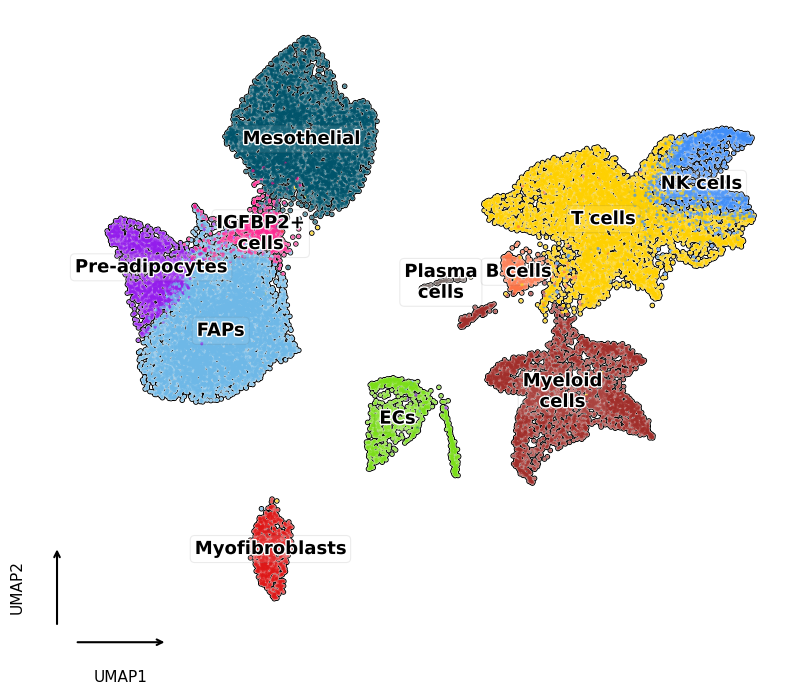

In [143]:
plot_umap_celltypes(
    adata_om,
    celltype_col="cell_type",
    celltype_colors=broad_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/omentum_celltypes.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=13,
    point_size=22
)


In [141]:
broad_ct_order_om = ["FAPs", "Pre-adipocytes", "IGFBP2+ cells", "Mesothelial", "ECs", "Myofibroblasts", "NK cells", "T cells", "B cells", "Plasma cells", "Myeloid cells"]

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_25264/3528755907.py:378: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


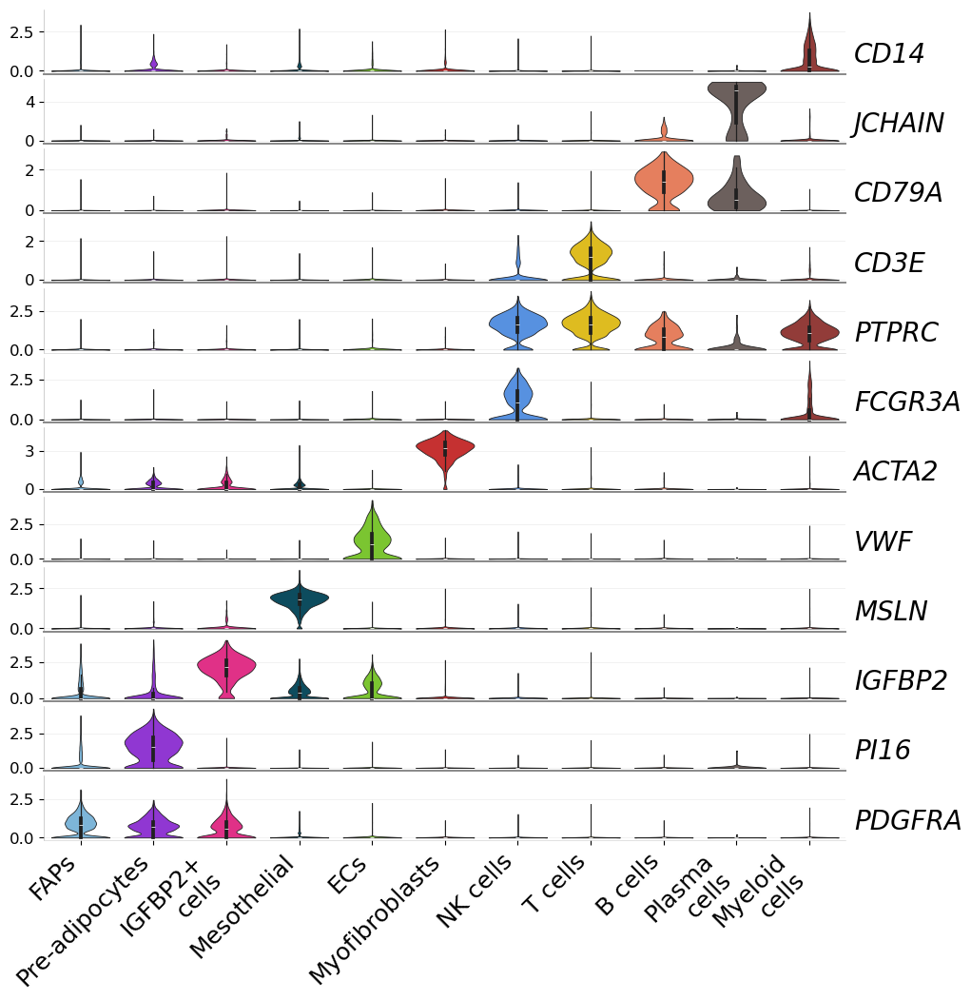

In [200]:
plot_marker_violins(
    adata_om,
    celltype_col = "cell_type",
    marker_genes = marker_genes_broad_cell_type,
    celltype_colors = broad_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/omentum_celltypes_violin.pdf",
    celltype_order = broad_ct_order_om,
    xlabelsize = 18,
    row_height = 0.75,
)

In [144]:
plt.close()

## SubQ

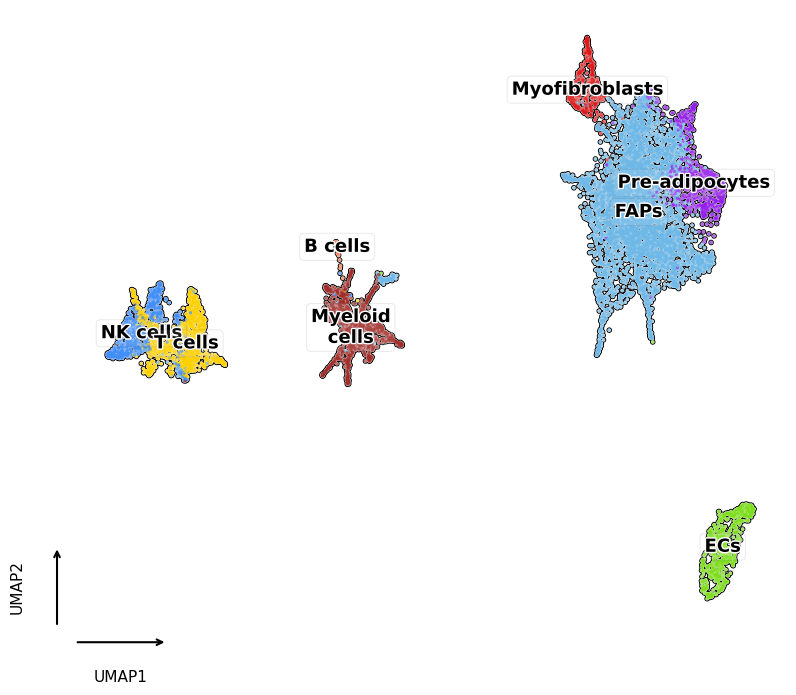

In [139]:
plot_umap_celltypes(
    adata_subq,
    celltype_col="cell_type",
    celltype_colors=broad_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/subq_celltypes.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=13,
    point_size=22
)

In [132]:
broad_ct_order_subq = ["FAPs", "Pre-adipocytes", "ECs", "Myofibroblasts", "NK cells", "T cells", "B cells", "Myeloid cells"]

In [202]:
marker_genes_broad_cell_type_subq = {
    "Myeloid cells": ['CD14'],
    # "Plasma cells": ["JCHAIN",], 
    "B cells": ['JCHAIN',],
    "T cells": ["CD3E",],
    "NK cells": ["PTPRC", "FCGR3A",],
    "Myofibroblasts": ["ACTA2",],
    "ECs": ["VWF",],
    "Mesothelial": ["MSLN",],
    "IGFBP2+ cells": ["IGFBP2",],
    "Pre-adipocytes": ["PI16",],
    "FAPs": ["PDGFRA",]
}

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_25264/3528755907.py:378: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


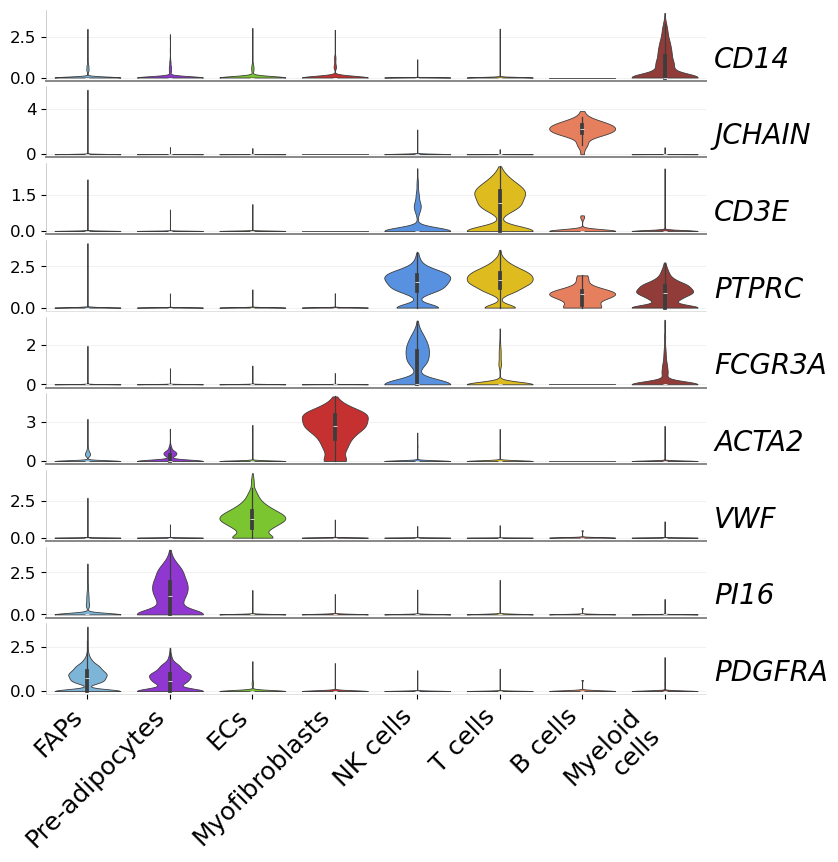

In [203]:
plot_marker_violins(
    adata_subq,
    celltype_col = "cell_type",
    marker_genes = {ct: marker_genes_broad_cell_type_subq[ct] for ct in broad_ct_order_subq[::-1]},
    celltype_colors = broad_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/subq_celltypes_violin.pdf",
    celltype_order = broad_ct_order_subq,
    xlabelsize = 18,
    row_height = 0.75,
)

In [190]:
sc.tl.rank_genes_groups(adata_subq, groupby="cell_type", method="wilcoxon", groups=["B cells",])

categories: B cells, ECs, FAPs, etc.
var_group_labels: B cells


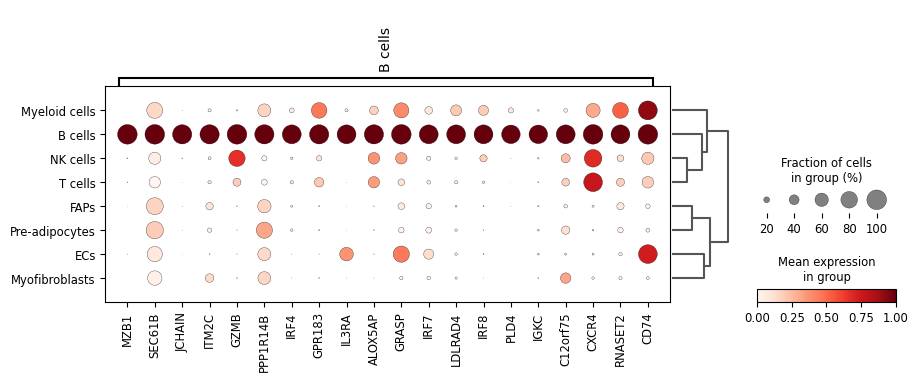

In [194]:
sc.pl.rank_genes_groups_dotplot(adata_subq, groupby="cell_type", standard_scale="var", n_genes=20)

In [198]:
adata_subq.obs.value_counts(["cell_type", "participant"]).sort_index().head(10)

cell_type  participant   
B cells    SQ_Healthy_0       6
           SQ_Healthy_1       5
           SQ_Healthy_4      11
           SQ_Unhealthy_0     2
           SQ_Unhealthy_2    14
           SQ_Unhealthy_3     1
           SQ_Unhealthy_4     3
ECs        SQ_Healthy_0      20
           SQ_Healthy_1      19
           SQ_Healthy_2      19
Name: count, dtype: int64

# Non-immume panel

In [102]:
cell_types_order_non_im = ["Pre_adipocytes", "FAPs", "LECs", "VECs", "Myofibroblasts"]

In [113]:
non_im_cell_type_colors = {
    # "Plasma cells": "#6e5f5b", 
    # "B cells": "#fc7447", # orange
    "LECs": "#FD1486", # pink
    # "Mesothelial": "#00546B", # dark green
    "Pre_adipocytes": "#941DEC", # violet
    "VECs": "#FED000", # yellow
    "FAPs": "#6EB8E7", # light blue
    # "NK cells": "#408EF7", # dark blue
    # "Myeloid cells": "#a12e2a", # dark red
    # "ECs": "#7bde18", # light green
    "Myofibroblasts": "#de1818"
}

In [99]:
marker_genes_nonim_cell_type = {
    # "Myeloid cells": ['CD14'],
    # "Plasma cells": ["JCHAIN",], 
    # "B cells": ["CD79A",],
    # "T cells": ["CD3E",],
    # "NK cells": ["PTPRC", "FCGR3A",],
    # "ECs": ["VWF",],
    # "Mesothelial": ["MSLN",],
    # "IGFBP2+ cells": ["IGFBP2",],
    'VECs':                  ["VWF",],
    'LECs':                  ['LYVE1',],# 'PROX1', 'PDPN', 'MMRN1'],
    "Pre_adipocytes": ["PI16",],
    "FAPs": ["PDGFRA",],
    "Myofibroblasts": ["ACTA2",],
}

## Omentum

In [100]:
ct_col = "cell_type1_"
participant_col = "common_participant"

In [103]:
adata = adata_om[adata_om.obs[ct_col].isin(cell_types_order_non_im),:]
adata.obs.value_counts(ct_col)

cell_type1_
FAPs              6787
Pre_adipocytes    1297
VECs               707
Myofibroblasts     697
LECs               163
Name: count, dtype: int64

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/819238103.py:1: ImplicitModificationWarning: Modifying `X` on a view results in data being overridden
  adata.X = adata.layers["counts"].copy()
/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/819238103.py:3: UserWarning: Received a view of an AnnData. Making a copy.
  sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)


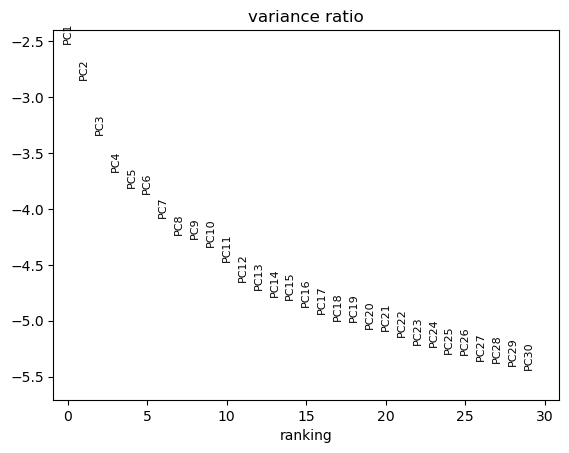

In [104]:
adata.X = adata.layers["counts"].copy()

sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

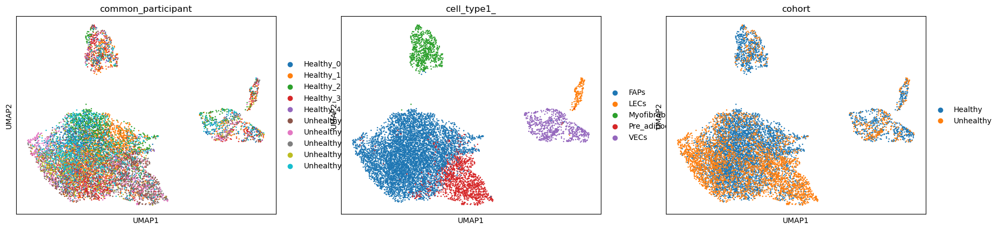

In [105]:
sc.pp.neighbors(adata, n_pcs=15, n_neighbors=10)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=[participant_col, ct_col, "cohort", ])

In [216]:
ec_markers = {
    "art": ["HEY1",],
    "cap": ["CA4", "RGCC"],
    "ven": ["VCAM1", "VWF"]
}
ec_genes = set(sum(ec_markers.values(), []))
ec_genes

{'CA4', 'HEY1', 'RGCC', 'VCAM1', 'VWF'}

In [223]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

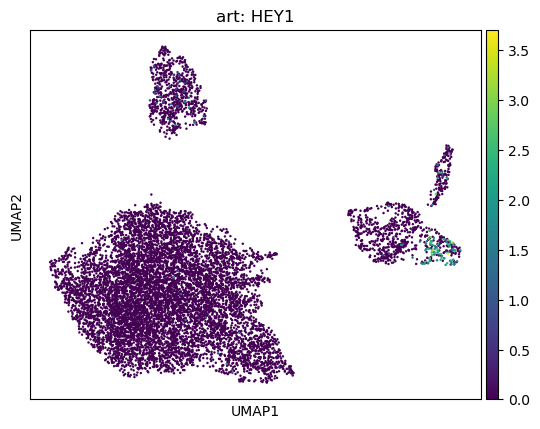

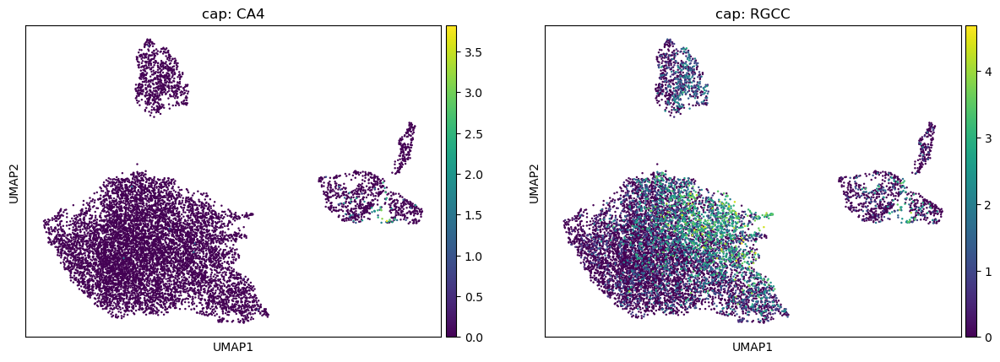

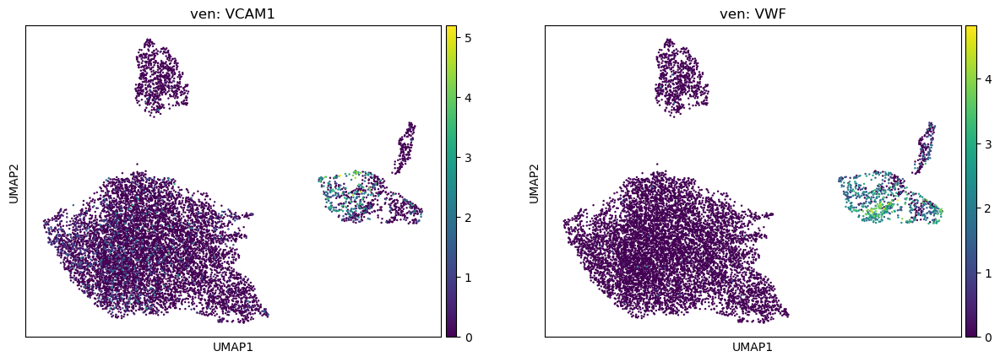

In [228]:
for endo_type, genes in ec_markers.items():
    sc.pl.umap(adata, color=genes, title=[f"{endo_type}: {gene}" for gene in genes])

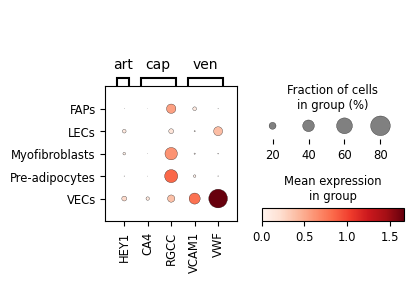

In [226]:
sc.pl.dotplot(adata, groupby="cell_type1", var_names=ec_markers)

In [106]:
adata_om_nonim = adata.copy()

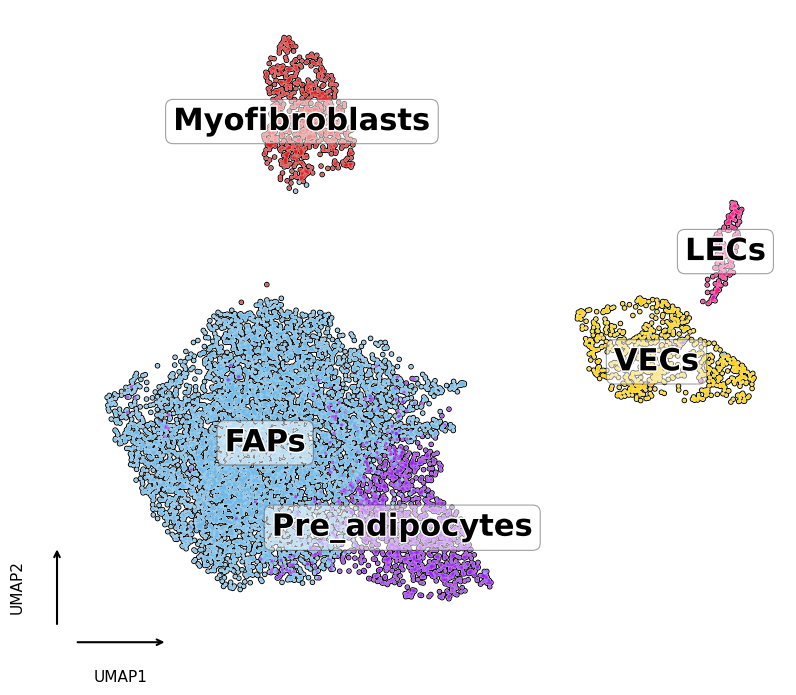

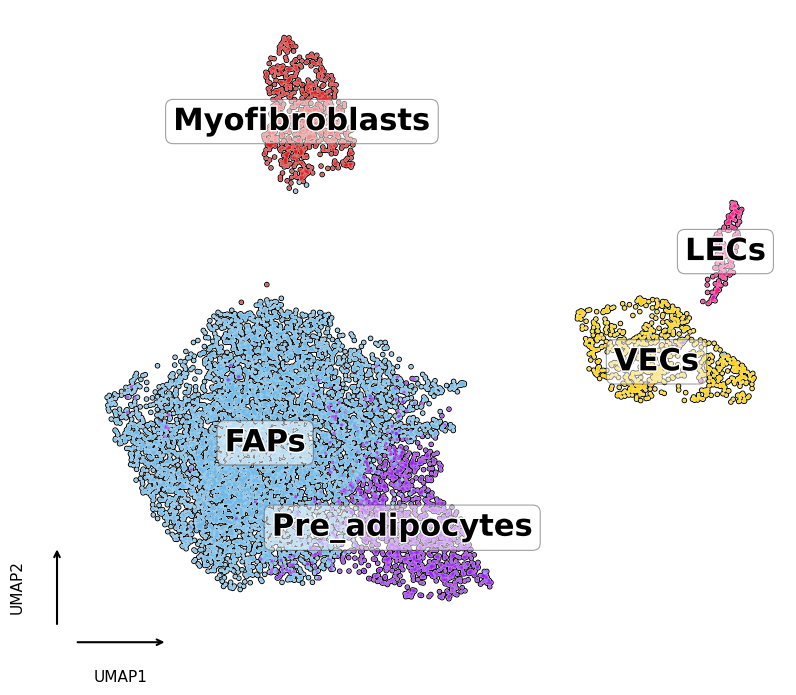

In [115]:
_LABEL_BBOX   = dict(facecolor="white", edgecolor="#444444", linewidth=0.8,
                     boxstyle="round,pad=0.25", alpha=0.5)


plot_umap_celltypes(
    adata_om_nonim,
    celltype_col="cell_type1_",
    celltype_colors=non_im_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/omentum_celltypes_nonim.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=22,
    point_size=22,
)


In [178]:
{ct: marker_genes_nonim_cell_type[ct] for ct in cell_types_order_non_im[::-1]}
non_im_cell_type_colors
cell_types_order_non_im

['Pre-adipocytes', 'FAPs', 'LECs', 'VECs', 'Myofibroblasts']

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_25264/3528755907.py:378: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


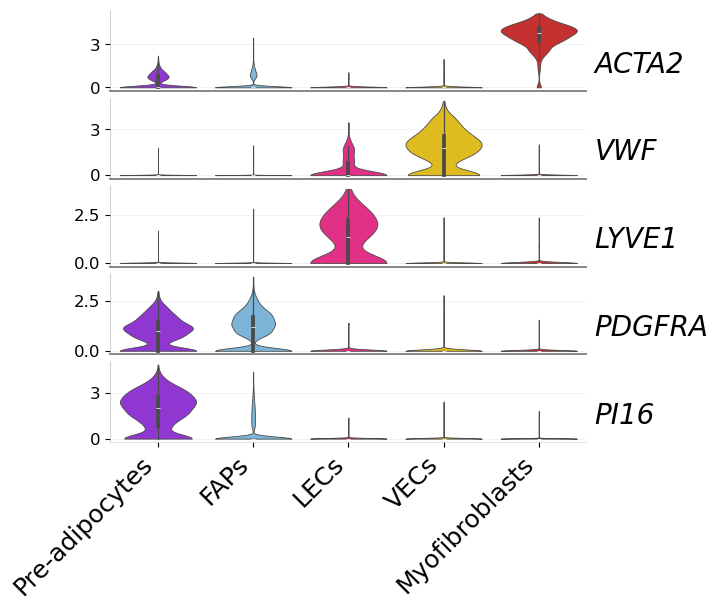

In [254]:
plot_marker_violins(
    adata_om_nonim,
    celltype_col = "cell_type1",
    marker_genes = {ct: marker_genes_nonim_cell_type[ct] for ct in cell_types_order_non_im[::-1]},
    celltype_colors = non_im_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/omentum_celltypes_violin_nonim.pdf",
    celltype_order = cell_types_order_non_im,
    xlabelsize = 18,
    row_height = 0.75,
)

In [129]:
plt.close()

## SubQ

In [116]:
ct_col = "cell_type1_"
participant_col = "participant"

In [118]:
adata_subq.obs.loc[adata_subq.obs[ct_col] == "LECs", ct_col] = "VECs"

In [119]:
adata = adata_subq[adata_subq.obs[ct_col].isin(cell_types_order_non_im),:]
adata.obs.value_counts(ct_col)

cell_type1_
FAPs              4983
Pre_adipocytes     634
VECs               549
Myofibroblasts     329
Name: count, dtype: int64

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/819238103.py:1: ImplicitModificationWarning: Modifying `X` on a view results in data being overridden
  adata.X = adata.layers["counts"].copy()
/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/819238103.py:3: UserWarning: Received a view of an AnnData. Making a copy.
  sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)


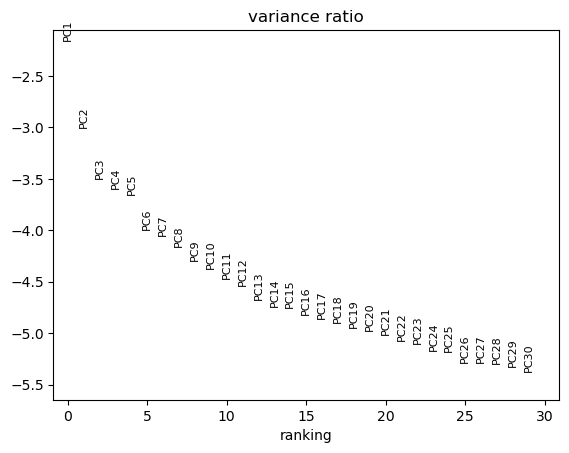

In [120]:
adata.X = adata.layers["counts"].copy()

sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

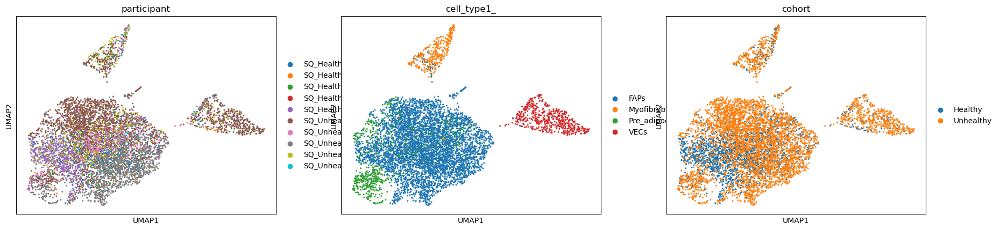

In [121]:
sc.pp.neighbors(adata, n_pcs=15, n_neighbors=10)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=[participant_col, ct_col, "cohort", ])

In [255]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [122]:
adata_subq_nonim = adata.copy()

In [257]:
ec_markers = {
    
    'VECs':                  ["VWF", "PECAM1", "CDH5"],
    'LECs':                  ['LYVE1','PROX1', 'PDPN', 'MMRN1'],
    "art": ["HEY1",],
    "cap": ["CA4", "RGCC"],
    "ven": ["VCAM1", "VWF"]
}
ec_genes = set(sum(ec_markers.values(), []))
ec_genes

{'CA4',
 'CDH5',
 'HEY1',
 'LYVE1',
 'MMRN1',
 'PDPN',
 'PECAM1',
 'PROX1',
 'RGCC',
 'VCAM1',
 'VWF'}

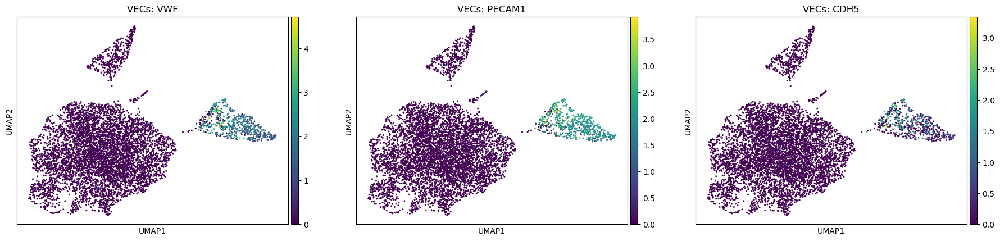

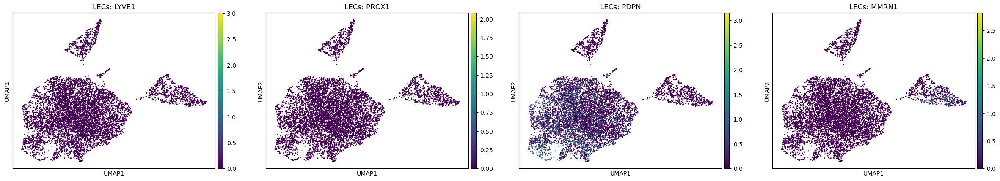

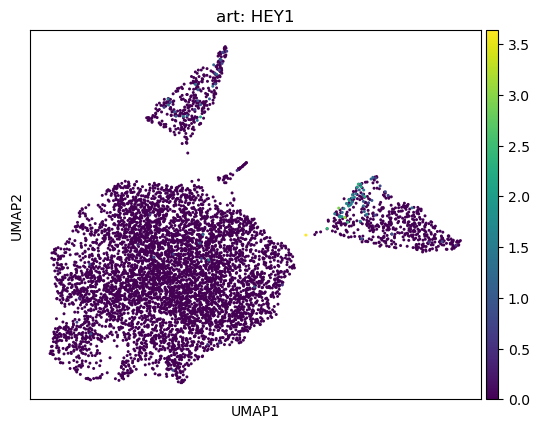

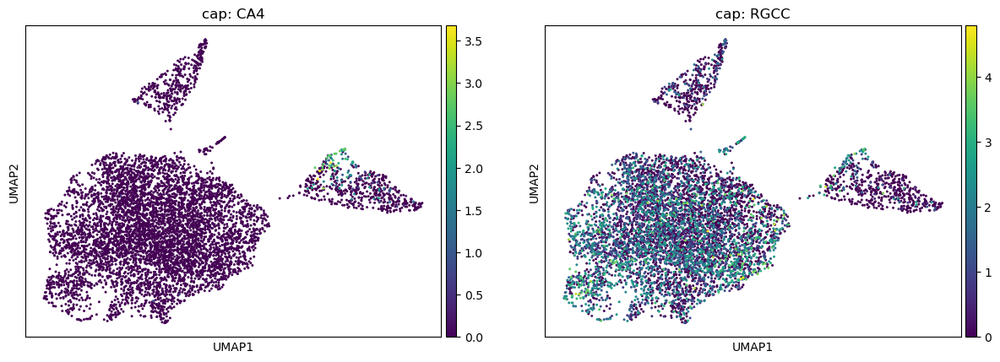

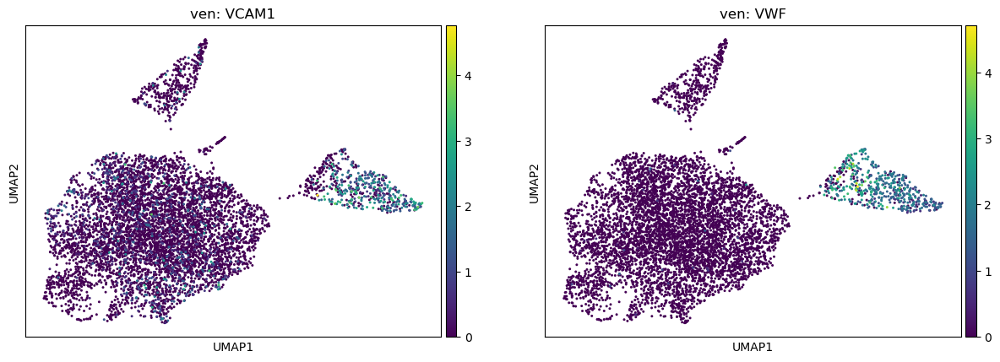

In [259]:
for endo_type, genes in ec_markers.items():
    sc.pl.umap(adata_subq_nonim, color=genes, title=[f"{endo_type}: {gene}" for gene in genes])

In [262]:
adata_subq_nonim.obs.loc[adata_subq_nonim.obs[ct_col] == "LECs", ct_col] = "VECs"

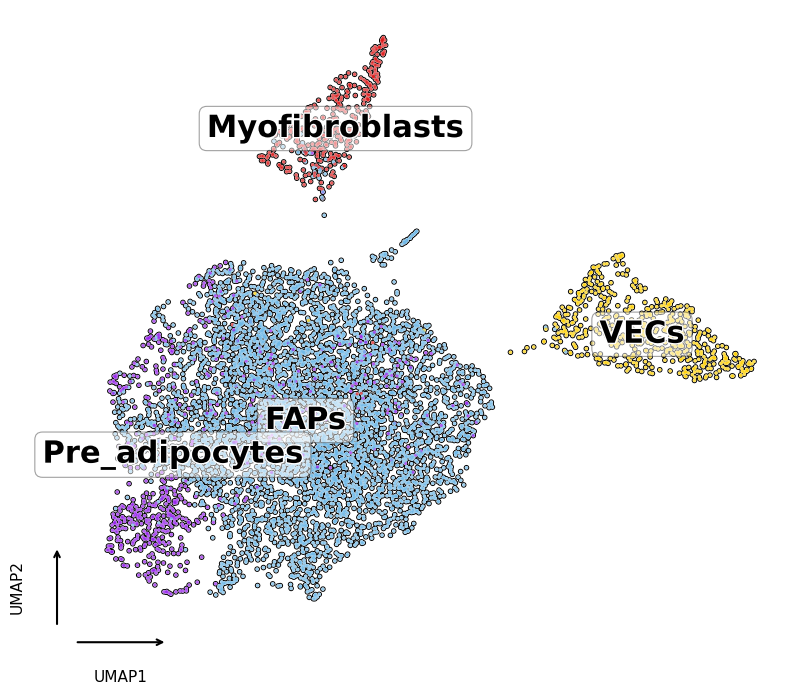

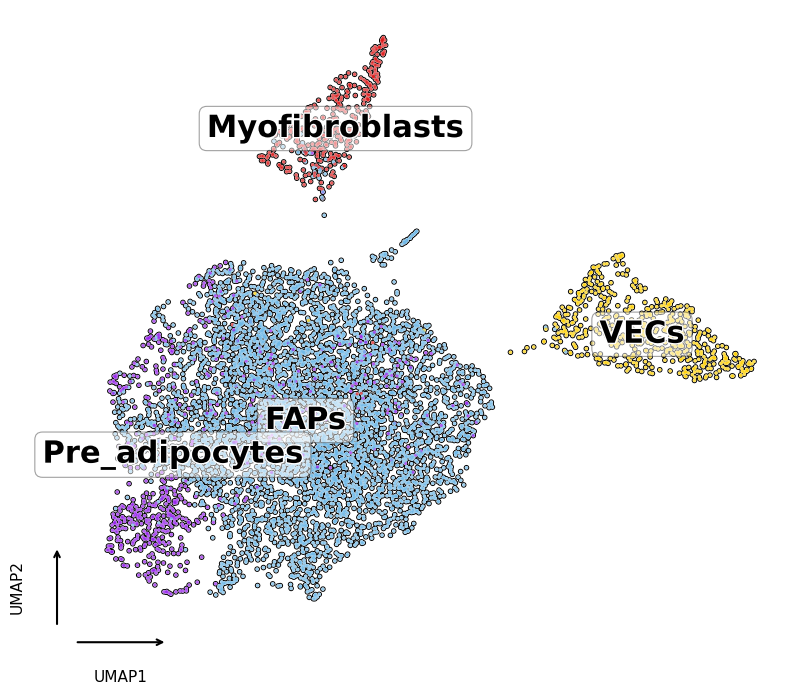

In [124]:
plot_umap_celltypes(
    adata_subq_nonim,
    celltype_col=ct_col,
    celltype_colors=non_im_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/subq_celltypes_nonim.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=22,
    point_size=22,
)

In [265]:
cell_types_order_non_im_subq = ["Pre-adipocytes", "FAPs", "VECs", "Myofibroblasts"]

In [268]:
adata_subq_nonim.obs[ct_col] = pd.Categorical(adata_subq_nonim.obs[ct_col], categories=cell_types_order_non_im_subq, ordered=True)

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_25264/3528755907.py:378: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


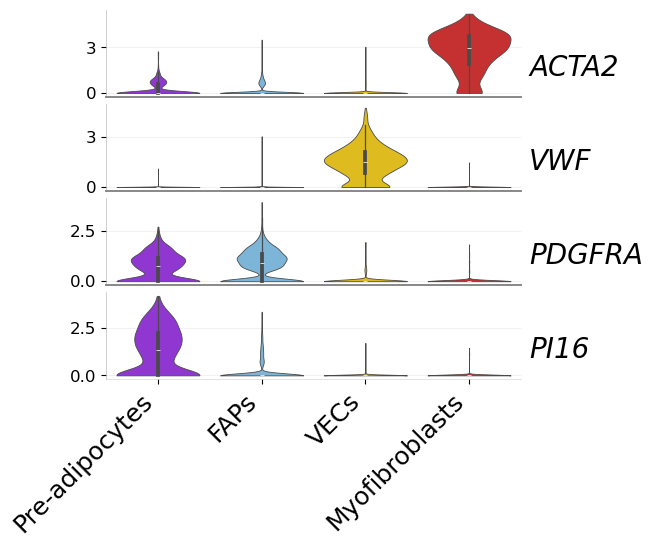

In [273]:
plot_marker_violins(
    adata_subq_nonim,
    celltype_col = ct_col,
    marker_genes = {ct: marker_genes_nonim_cell_type[ct] for ct in cell_types_order_non_im_subq[::-1]},
    celltype_colors = {ct: non_im_cell_type_colors[ct] for ct in cell_types_order_non_im_subq[::-1]},
    save_path = f"{OUTPUT_DIR}/subq_celltypes_violin_nonim.pdf",
    celltype_order = cell_types_order_non_im_subq,
    xlabelsize = 18,
    row_height = 0.75,
)

# Myeloid panel

In [267]:
myeloid_pretty_names = {
    "CD9_ATM":     "CD9+ ATM",
    "cDCs":        "cDCs",
    "cDC1s":       "cDC1s",
    "cDC2Bs":      "cDC2Bs",
    "pDCs":        "pDCs",
    "Macrophages": "Macrophages",
    "Monocytes":   "Monocytes",
    "Neutrophils": "Neutrophils",
}


In [268]:
cell_types_order_myel = ["Monocytes", "Neutrophils", "pDCs", "cDCs", "LAMs", "PVMs", "CD9_ATM", "cDC1s", "cDC2Bs"]
cell_types_order_lymph = ["CD4_T_cells", "Effector_CD8_T_cells", "CD8_T_cells", "CD8_TRM", "mNK1_cells", "mNK2_cells", "mNK3_cells", "NA_CD4_T_cells", "B_cells", "CM_CD4_T_cells", "GD_T_cells", "EM_CD4_T_cells", "Plasma_cells", "Tregs", "PLCG2_cells", "CD4_T_cells"]

In [269]:
len(cell_types_order_myel)

9

In [128]:
# im_cell_type_colors = {
#     # "Plasma cells": "#6e5f5b", 
#     # "B cells": "#fc7447", # orange
#     "LECs": "#FD1486", # pink
#     # "Mesothelial": "#00546B", # dark green
#     "Pre-adipocytes": "#941DEC", # violet
#     "VECs": "#FED000", # yellow
#     "FAPs": "#6EB8E7", # light blue
#     # "NK cells": "#408EF7", # dark blue
#     # "Myeloid cells": "#a12e2a", # dark red
#     # "ECs": "#7bde18", # light green
#     "Myofibroblasts": "#de1818"
    
#     "Monocytes", "Neutrophils", "cDCs", "pDCS" "Macrophages", "cDC1s", "cDC2Bs",
#     "CD4_T_cells", "Effector_CD8_T_cells", "CD8_T_cells", "CD8_TRM", "mNK1_cells", "mNK2_cells", "mNK3_cells", "NA_CD4_T_cells", "B_cells", "CM_CD4_T_cells", "GD_T_cells", "EM_CD4_T_cells", "Plasma_cells", "Tregs", "PLCG2_cells", "CD4_T_cells"
# }
colors = [
    "#E63946",  # red
    "#2196F3",  # blue
    "#2DC653",  # green
    "#FF9800",  # orange
    "#9C27B0",  # purple
    "#00BCD4",  # cyan
    "#F06292",  # pink
    "#FFEB3B",  # yellow
    "#795548",  # brown
    "#607D8B",  # blue-grey
    "#00897B",  # teal
    "#FF5722",  # deep orange
    "#3F51B5",  # indigo
    "#8BC34A",  # light green
    "#F44336",  # crimson
    "#673AB7",  # deep purple
    "#03A9F4",  # light blue
    "#CDDC39",  # lime
    "#FF4081",  # hot pink
    "#1B998B",  # seafoam
    "#E91E63",  # magenta
    "#FFC107",  # amber
]
myel_cell_type_colors = dict(zip(cell_types_order_myel, colors[:len(cell_types_order_myel)]))

In [129]:
lymph_cell_type_colors

{'CD4_T_cells': '#6D4C41',
 'Effector_CD8_T_cells': '#FF5722',
 'CD8_T_cells': '#3F51B5',
 'CD8_TRM': '#8BC34A',
 'mNK1_cells': '#F44336',
 'mNK2_cells': '#673AB7',
 'mNK3_cells': '#03A9F4',
 'NA_CD4_T_cells': '#CDDC39',
 'B_cells': '#FF4081',
 'CM_CD4_T_cells': '#1B998B',
 'GD_T_cells': '#E91E63',
 'EM_CD4_T_cells': '#FFC107',
 'Plasma_cells': '#4E9AF1',
 'Tregs': '#D4A017',
 'PLCG2_cells': '#A8DADC'}

In [285]:
# marker_genes_myel_cell_type = {
#     'Neutrophils':           ['FCGR3B', 'CSF3R', 'CXCR1', 'G0S2', 'S100A8'],
#     'Monocytes':             ['S100A9', 'CD14', 'VCAN', 'FCN1'],
#     'cDCs':                  ['CLEC9A', 'XCR1', 'CD1C', 'FCER1A'],
#     'cDC1s':                 ['CADM1', 'IDO1'],
#     'cDC2Bs':                ['CLEC10A', 'CD1E'],
#     'pDCs':                  ['LILRA4', 'CLEC4C', 'IL3RA', 'TCF4'],
#     'LAMs':                  ['TREM2', 'LGALS3'],
#     'PVMs':                  ['LYVE1', 'TIMD4', 'FOLR2', 'CX3CR1'],
#     'CD9_ATM':              ['CD9', 'PLIN2'],
#     'PLCG2_cells':          ['PLCG2', 'FCGR3A', 'CX3CR1', 'LST1'],
# }
marker_genes_myel_cell_type = {
    'Neutrophils':           ['S100A8',],
    'Monocytes':             ["FCGR3A", "PTPRC"], 
    'cDCs':                  ['CD1C', 'FCER1A'],
    'cDC1s':                 ["TACSTD2", 'CADM1', 'IDO1'],
    'cDC2Bs':                ["FCER1A", 'CLEC10A'],
    'pDCs':                  ['CLEC4C', 'IL3RA'],
    'LAMs':                  ['TREM2', "PLIN2"],
    'PVMs':                  ['LYVE1'],
    'CD9_ATM':              ['CD9',],
    'PLCG2_cells':          ['PLCG2', 'CX3CR1', 'LST1'],
}

## Omentum

In [270]:
cell_types_order_myel

['Monocytes',
 'Neutrophils',
 'pDCs',
 'cDCs',
 'LAMs',
 'PVMs',
 'CD9_ATM',
 'cDC1s',
 'cDC2Bs']

In [271]:
ct_col = "cell_type1_"
participant_col = "common_participant"

In [272]:
adata = adata_om[adata_om.obs[ct_col].isin(cell_types_order_myel),:].copy()
adata.obs.value_counts(ct_col)

cell_type1_
Neutrophils    858
cDCs           596
PVMs           535
Monocytes      397
LAMs           224
pDCs           118
CD9_ATM         52
Name: count, dtype: int64

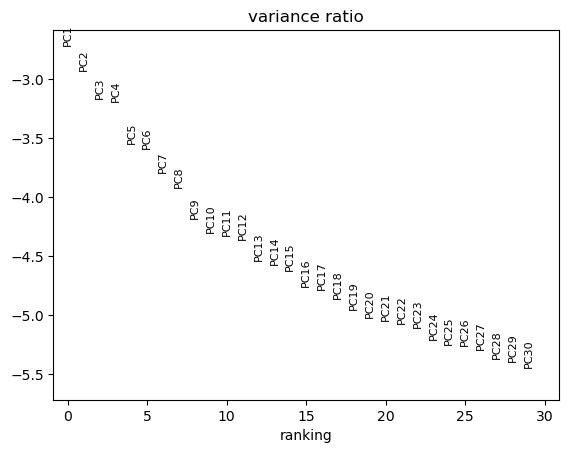

In [273]:
adata.X = adata.layers["counts"].copy()

sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

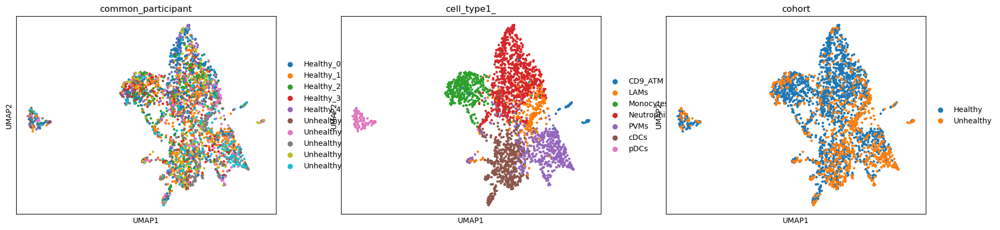

In [191]:
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=20)
sc.tl.umap(adata, min_dist=0.3)
sc.pl.umap(adata, color=[participant_col, ct_col, "cohort", ])

In [274]:
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)

In [206]:
sc.tl.rank_genes_groups(adata, groupby=ct_col, method="wilcoxon")
ct_col

'cell_type1_'

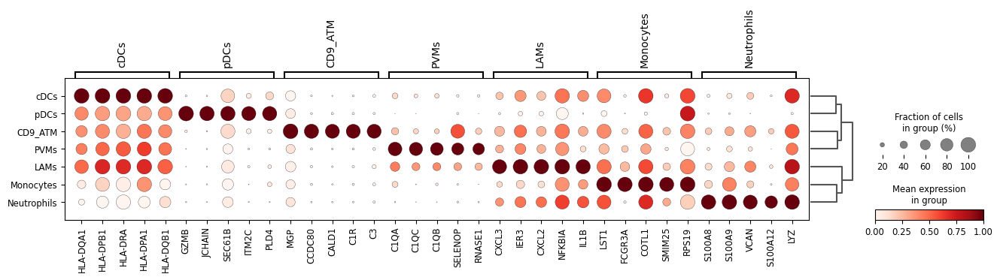

In [207]:
sc.pl.rank_genes_groups_dotplot(adata, groupby=ct_col, standard_scale="var", n_genes=5)

In [275]:
adata_om_myel = adata.copy()

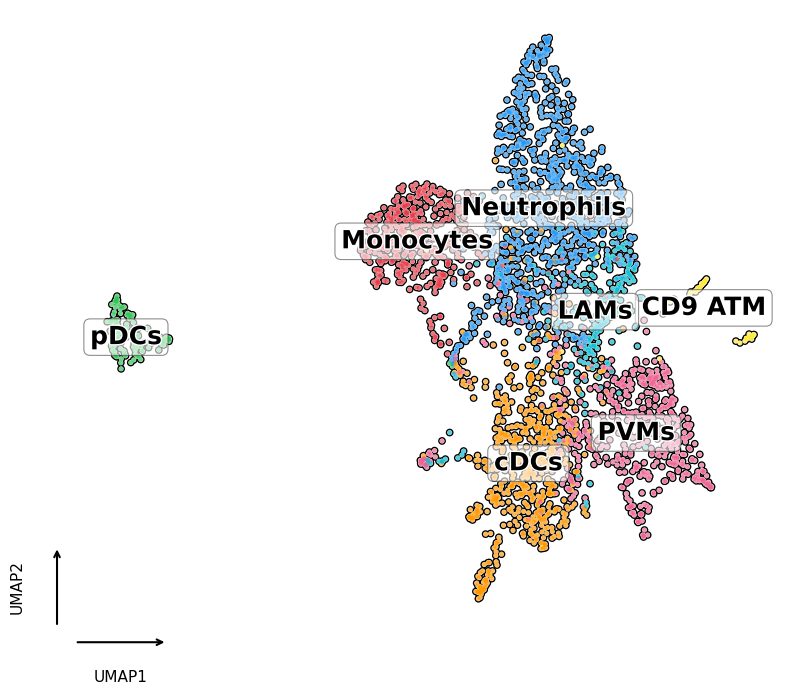

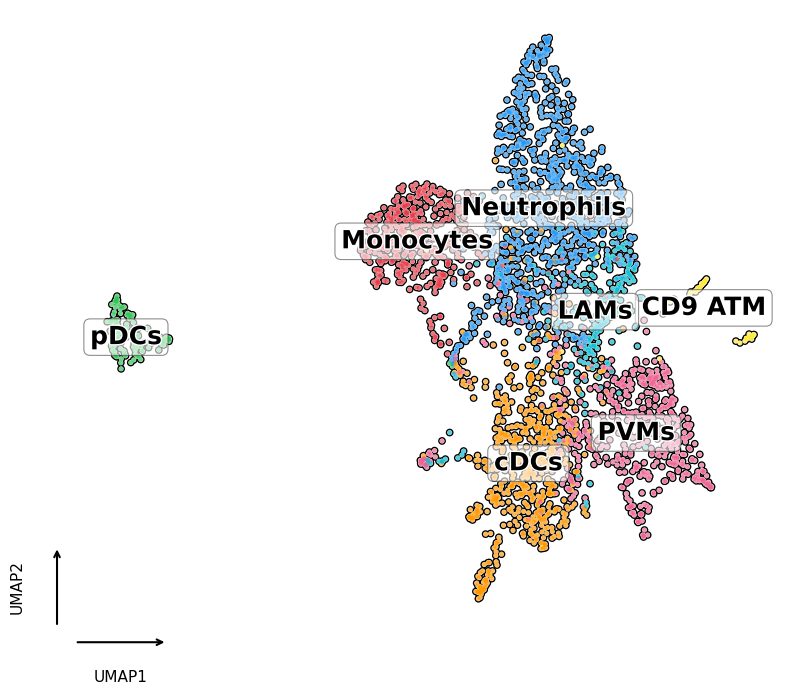

In [64]:
plot_umap_celltypes(
    adata_om_myel,
    celltype_col=ct_col,
    celltype_colors=myel_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/omentum_celltypes_myel.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=18,
    point_size=None,
    prettify_labels=myeloid_pretty_names
)


In [173]:
{ct: [mg for mg in marker_genes_myel_cell_type[ct] if mg in adata_om_myel.var_names] for ct in cell_types_order_myel[::-1]}

{'cDC2Bs': ['CD1C', 'FCER1A', 'CLEC10A', 'CD1E'],
 'cDC1s': ['CLEC9A', 'XCR1', 'CADM1', 'IDO1'],
 'CD9_ATM': ['CD9', 'TREM2', 'PLIN2', 'LGALS3'],
 'PVMs': ['LYVE1', 'TIMD4', 'FOLR2', 'CX3CR1'],
 'LAMs': ['TREM2', 'PLIN2', 'CD9', 'LGALS3'],
 'pDCs': ['LILRA4', 'CLEC4C', 'IL3RA', 'TCF4'],
 'cDCs': ['CLEC9A', 'XCR1', 'CD1C', 'FCER1A'],
 'Neutrophils': ['FCGR3B', 'CSF3R', 'CXCR1', 'G0S2', 'S100A8'],
 'Monocytes': ['S100A8', 'S100A9', 'CD14', 'VCAN', 'FCN1']}

In [214]:
{ct: marker_genes_myel_cell_type[ct] for ct in cell_types_order_myel[::-1]}

{'cDC2Bs': ['FCER1A', 'CLEC10A', 'CD1E'],
 'cDC1s': ['TACSTD2', 'CADM1', 'IDO1'],
 'CD9_ATM': ['CD9', 'PLIN2'],
 'PVMs': ['MR1', 'LYVE1', 'TIMD4', 'FOLR2', 'CX3CR1'],
 'LAMs': ['TREM2', 'LGALS3'],
 'pDCs': ['LILRA4', 'CLEC4C', 'IL3RA', 'TCF4'],
 'cDCs': ['CLEC9A', 'XCR1', 'CD1C', 'FCER1A'],
 'Neutrophils': ['THBS1', 'FCGR3B', 'CSF3R', 'CXCR1', 'G0S2', 'S100A8'],
 'Monocytes': ['FCGR3A', 'S100A9', 'CD14', 'VCAN', 'FCN1']}

In [240]:
cell_types_order_myel_om = [
    ct for ct in cell_types_order_myel if ct in adata_om_myel.obs[ct_col].unique()]

In [236]:
adata_om_myel.obs[ct_col].unique()

['PVMs', 'Neutrophils', 'LAMs', 'Monocytes', 'cDCs', 'pDCs', 'CD9_ATM']
Categories (7, object): ['CD9_ATM', 'LAMs', 'Monocytes', 'Neutrophils', 'PVMs', 'cDCs', 'pDCs']

In [241]:
cell_types_order_myel_om

['Monocytes', 'Neutrophils', 'pDCs', 'cDCs', 'LAMs', 'PVMs', 'CD9_ATM']

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/1325155747.py:407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


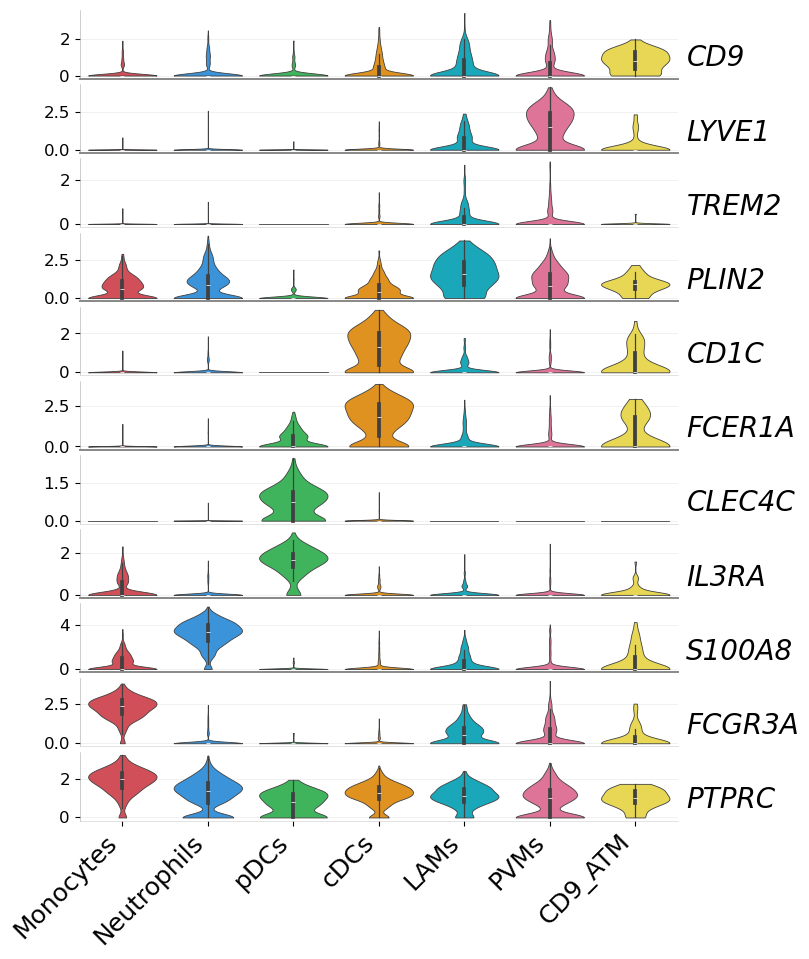

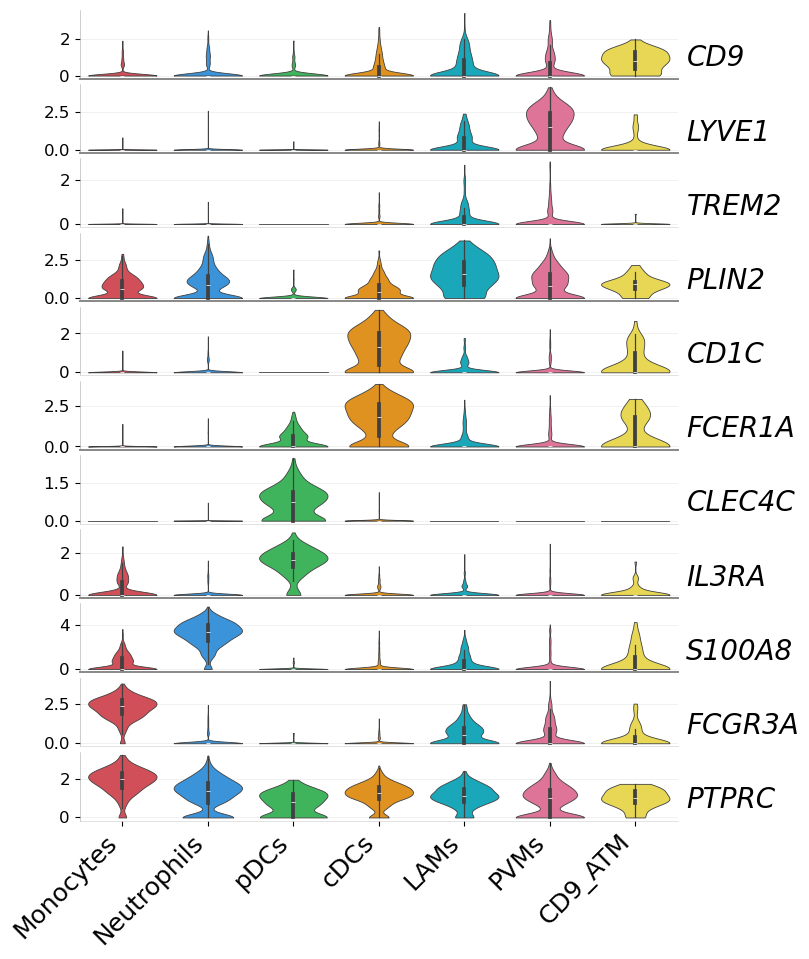

In [286]:
cell_types_order_myel_om = [ct for ct in cell_types_order_myel if ct in adata_om_myel.obs[ct_col].unique()]

plot_marker_violins(
    adata_om_myel,
    celltype_col = "cell_type1_",
    marker_genes = {ct: marker_genes_myel_cell_type[ct] for ct in cell_types_order_myel_om[::-1]},
    celltype_colors = myel_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/omentum_celltypes_violin_myel.pdf",
    celltype_order = cell_types_order_myel_om,
    xlabelsize = 18,
    row_height = 0.75,
)

In [225]:
t.value_counts("cell_type1_")

cell_type1_
Neutrophils    858
cDCs           596
PVMs           535
Monocytes      397
LAMs           224
pDCs           118
CD9_ATM         52
Name: count, dtype: int64

## Subq

In [279]:
ct_col = "cell_type1_"
participant_col = "common_participant"

In [280]:
adata = adata_subq[adata_subq.obs[ct_col].isin(cell_types_order_myel),:].copy()
adata.obs.value_counts(ct_col)

cell_type1_
LAMs         329
cDC2Bs       259
Monocytes    176
PVMs          41
cDC1s         30
Name: count, dtype: int64

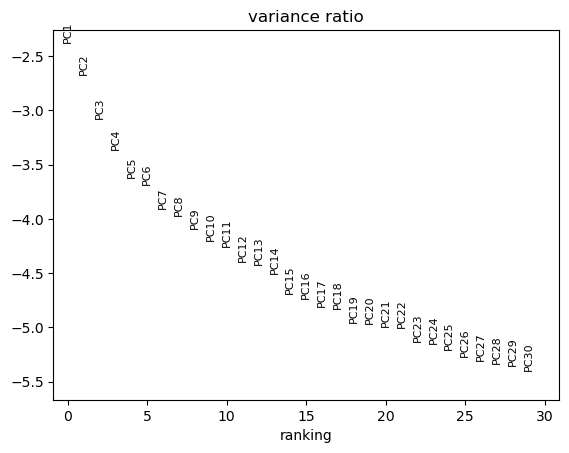

In [281]:
adata.X = adata.layers["counts"].copy()

sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

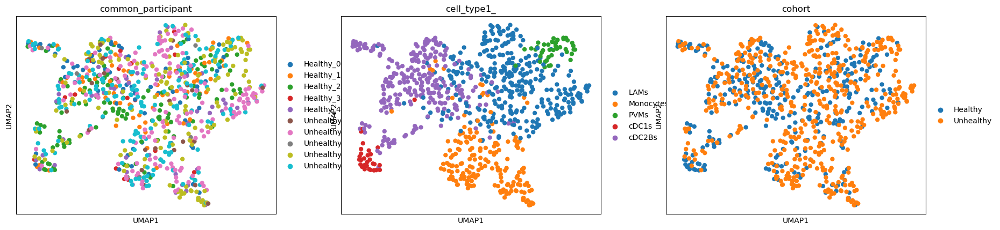

In [252]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=10)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=[participant_col, ct_col, "cohort", ])

In [282]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [283]:
adata_subq_myel = adata.copy()

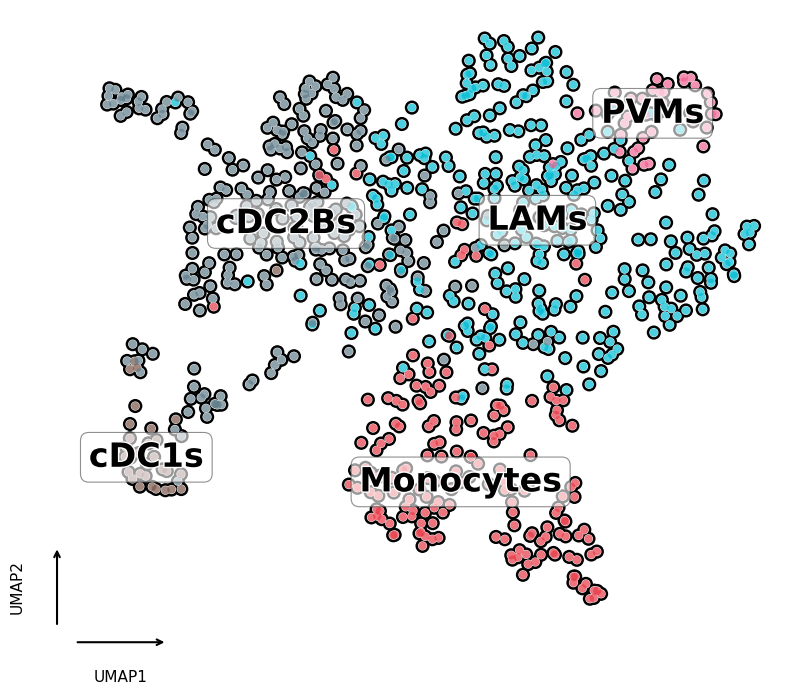

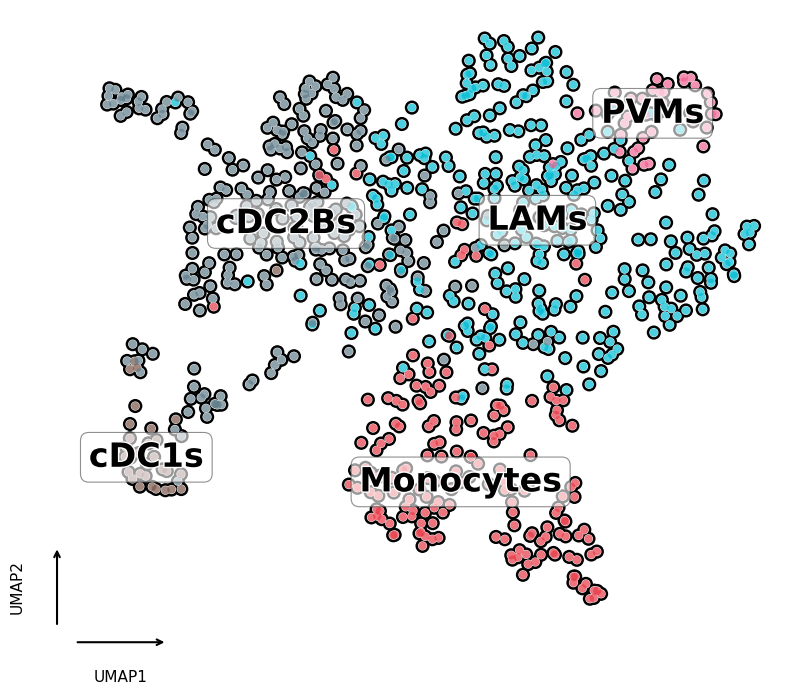

In [18]:
_LABEL_BBOX   = dict(facecolor="white", edgecolor="#444444", linewidth=0.8,
                     boxstyle="round,pad=0.25", alpha=0.6)

plot_umap_celltypes(
    adata_subq_myel,
    celltype_col=ct_col,
    celltype_colors=myel_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/subq_celltypes_myel.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=24,
    point_size=None
)


/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/1325155747.py:407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


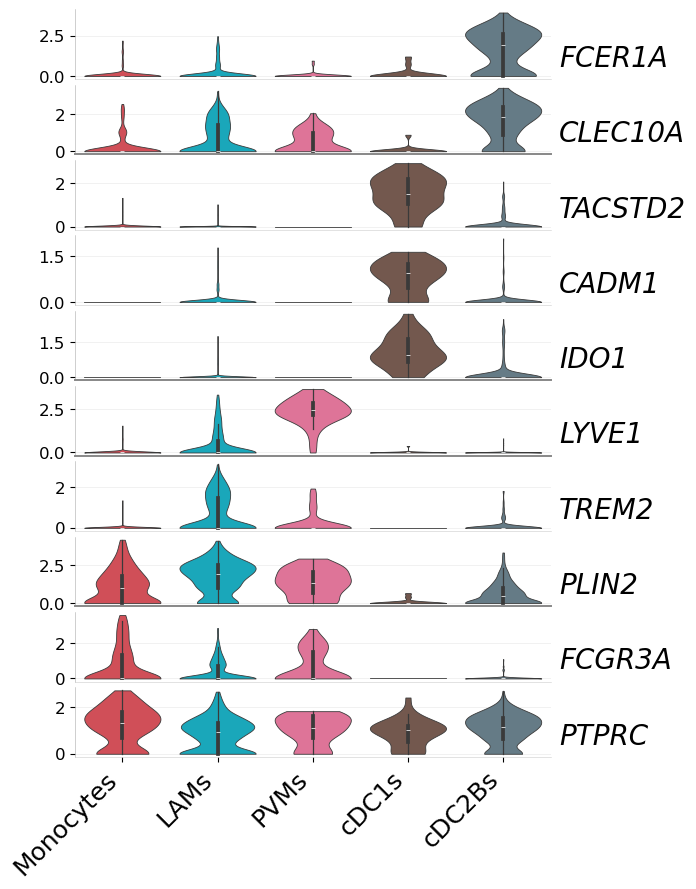

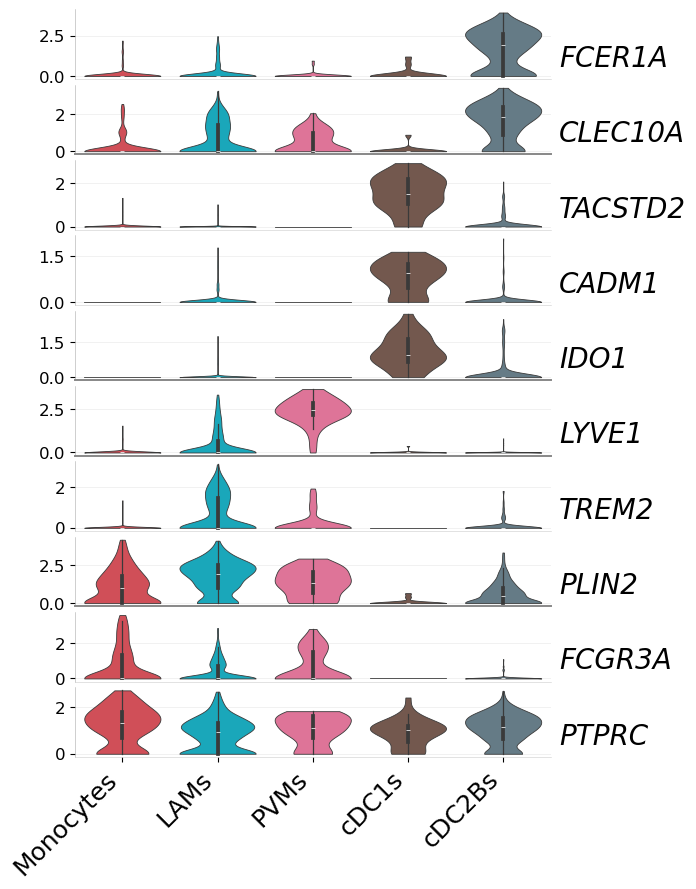

In [287]:
cell_types_order_myel_subq = [ct for ct in cell_types_order_myel if ct in adata_subq_myel.obs[ct_col].unique()]

plot_marker_violins(
    adata_subq_myel,
    celltype_col = "cell_type1_",
    marker_genes = {ct: marker_genes_myel_cell_type[ct] for ct in cell_types_order_myel_subq[::-1]},
    celltype_colors = myel_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/subq_celltypes_violin_myel.pdf",
    celltype_order = cell_types_order_myel_subq,
    xlabelsize = 18,
    row_height = 0.75,
)

# Lymphoid panel

In [329]:
cell_types_order_lymph = [
    "CD4_T_cells", "NA_CD4_T_cells", "CM_CD4_T_cells", "EM_CD4_T_cells", 
    "Effector_CD8_T_cells", "CD8_T_cells", "CD8_TRM",
    "GD_T_cells", "mNK1_cells", "mNK2_cells", "mNK3_cells", 
    "Tregs", "PLCG2_cells", "B_cells", "Plasma_cells"]

In [133]:
len(cell_types_order_lymph)

16

In [258]:
# im_cell_type_colors = {
#     # "Plasma cells": "#6e5f5b", 
#     # "B cells": "#fc7447", # orange
#     "LECs": "#FD1486", # pink
#     # "Mesothelial": "#00546B", # dark green
#     "Pre-adipocytes": "#941DEC", # violet
#     "VECs": "#FED000", # yellow
#     "FAPs": "#6EB8E7", # light blue
#     # "NK cells": "#408EF7", # dark blue
#     # "Myeloid cells": "#a12e2a", # dark red
#     # "ECs": "#7bde18", # light green
#     "Myofibroblasts": "#de1818"
    
#     "Monocytes", "Neutrophils", "cDCs", "pDCS" "Macrophages", "cDC1s", "cDC2Bs",
#     "CD4_T_cells", "Effector_CD8_T_cells", "CD8_T_cells", "CD8_TRM", "mNK1_cells", "mNK2_cells", "mNK3_cells", "NA_CD4_T_cells", "B_cells", "CM_CD4_T_cells", "GD_T_cells", "EM_CD4_T_cells", "Plasma_cells", "Tregs", "PLCG2_cells", "CD4_T_cells"
# }
colors = [
    "#E63946",  # red
    "#2196F3",  # blue
    "#2DC653",  # green
    "#FF9800",  # orange
    "#9C27B0",  # purple
    "#00BCD4",  # cyan
    "#F06292",  # pink
    "#FFEB3B",  # yellow
    "#795548",  # brown
    "#607D8B",  # blue-grey
    "#00897B",  # teal
    "#FF5722",  # deep orange
    "#3F51B5",  # indigo
    "#8BC34A",  # light green
    "#F44336",  # crimson
    "#673AB7",  # deep purple
    "#03A9F4",  # light blue
    "#CDDC39",  # lime
    "#FF4081",  # hot pink
    "#1B998B",  # seafoam
    "#E91E63",  # magenta
    "#FFC107",  # amber
    "#4E9AF1",  # cornflower blue
    "#D4A017",  # golden ochre
    "#A8DADC",  # pale aqua
    "#6D4C41",  # dark mahogany
]

lymph_cell_type_colors = dict(zip(cell_types_order_lymph, colors[:len(cell_types_order_lymph)]))

In [259]:
len(cell_types_order_lymph)

16

In [143]:

lymphoid_pretty_names = {
    "B_cells":               "B cells",
    "Plasma_cells":          "Plasma cells",
    "mNK1_cells":            "mNK1 cells",
    "mNK2_cell":             "mNK2 cells",
    "mNK2_cells":            "mNK2 cells",
    "mNK3_cells":            "mNK3 cells",
    "GD_T_cells":            "GD\nT cells",
    "CD8_TRM":               "CD8 TRM",
    "Effector_CD8_T_cells":  "Effector\nCD8 T cells",
    "CD8_T_cells":           "CD8 T cells",
    "EM_CD4_T_cells":        "EM CD4\nT cells",
    "NA_CD4_T_cells":        "NA CD4\nT cells",
    "CD4_T_cells":           "CD4 T cells",
    "CM_CD4_T_cells":        "CM CD4\nT cells",
    "Tregs":                 "Tregs",
    "PLCG2_cells":           "PLGC2+ cells",
}


In [440]:
marker_genes_lymph_cell_type = {
    # T cells
    'CD4_T_cells':          ['CD4', 'CCL5', 'IL7R', "CD3E", "PTPRC"],
    'NA_CD4_T_cells':       ['LEF1', "TCF7"],
    'CM_CD4_T_cells':       [],
    'EM_CD4_T_cells':       ['GNLY', 'GZMB','GZMK', 'NKG7', ],
    'CD8_T_cells':          ["IFNG", 'CD8A', "FCGR2B"],
    'Effector_CD8_T_cells': ["CD6", "TIGIT", "LAG3", "GATA3"],
    'CD8_TRM':              ["IL2", "KLF2", "HAVCR2", "ITGA1"],
    'Tregs':                 ['FOXP3', 'IL2RA', 'CTLA4', 'IKZF2'],
    "PLCG2_cells":           ["PLCG2",],
    'GD_T_cells':            ['TRGC2', 'KLRG1'],
    # NK
    'mNK1_cells':            ['KLRD1', 'S1PR5'],
    'mNK2_cells':            ['FCER1G', 'XCL1', 'XCL2',],
    # 'mNK2_cell':             ['XCL1', 'XCL2', 'KIT', 'SELL'],
    'mNK3_cells':            ['CX3CR1', 'FCGR3A'],
    
    "Plasma_cells":          ["JCHAIN"],
    "B_cells":               ["CD79A", ]
}

In [319]:
cell_types_order_lymph_om

['CD4_T_cells',
 'Effector_CD8_T_cells',
 'CD8_T_cells',
 'CD8_TRM',
 'mNK1_cells',
 'mNK2_cells',
 'mNK3_cells',
 'NA_CD4_T_cells',
 'B_cells',
 'CM_CD4_T_cells',
 'GD_T_cells',
 'EM_CD4_T_cells',
 'Plasma_cells']

## Omentum

In [295]:
ct_col = "cell_type2_"
participant_col = "common_participant"

In [263]:
adata_om.obs["cell_type2_"] = adata_om.obs["cell_type2_"].astype(str)
adata_om.obs.loc[adata_om.obs["cell_type2_"] == "mNK2_cell", "cell_type2_"] = "mNK2_cells"
adata_om.obs["cell_type2_"] = pd.Categorical(adata_om.obs["cell_type2_"])

In [353]:
adata = adata_om[adata_om.obs[ct_col].isin(cell_types_order_lymph),:].copy()
adata.obs.value_counts(ct_col)

cell_type2_
CD4_T_cells             2210
Effector_CD8_T_cells     957
CD8_T_cells              943
CD8_TRM                  887
mNK3_cells               564
mNK1_cells               410
NA_CD4_T_cells           392
B_cells                  374
mNK2_cells               373
CM_CD4_T_cells           244
GD_T_cells               198
EM_CD4_T_cells            89
Plasma_cells              61
Name: count, dtype: int64

In [355]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
adata.var["rb"] = adata.var_names.str.match(r"^RP[SL]\d")

In [358]:
adata = adata[:,~adata.var.rb].copy()

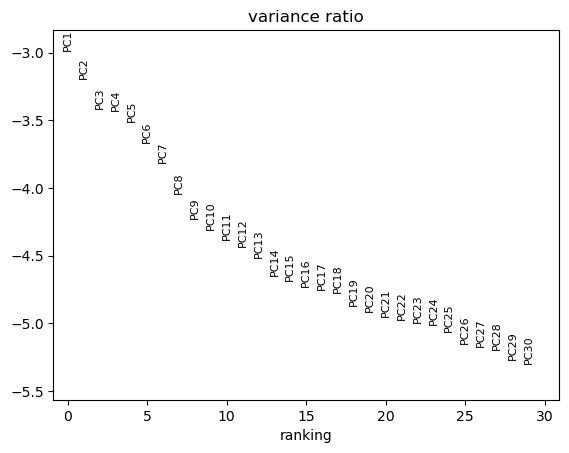

In [359]:
adata.X = adata.layers["counts"].copy()

sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

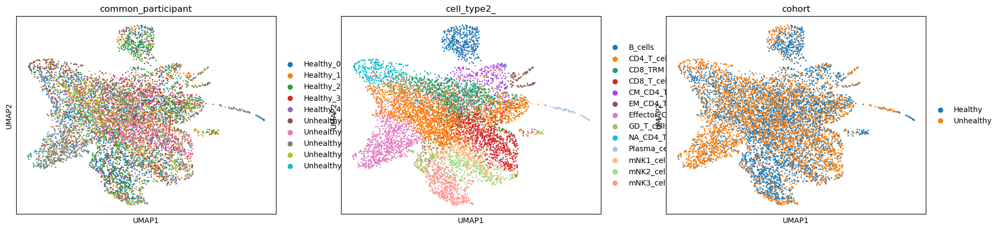

In [140]:
sc.pp.neighbors(adata, n_pcs=20, n_neighbors=10)
sc.tl.umap(adata, min_dist=0.7)
sc.pl.umap(adata, color=[participant_col, ct_col, "cohort", ])

In [360]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [361]:
adata_om_lymph = adata.copy()

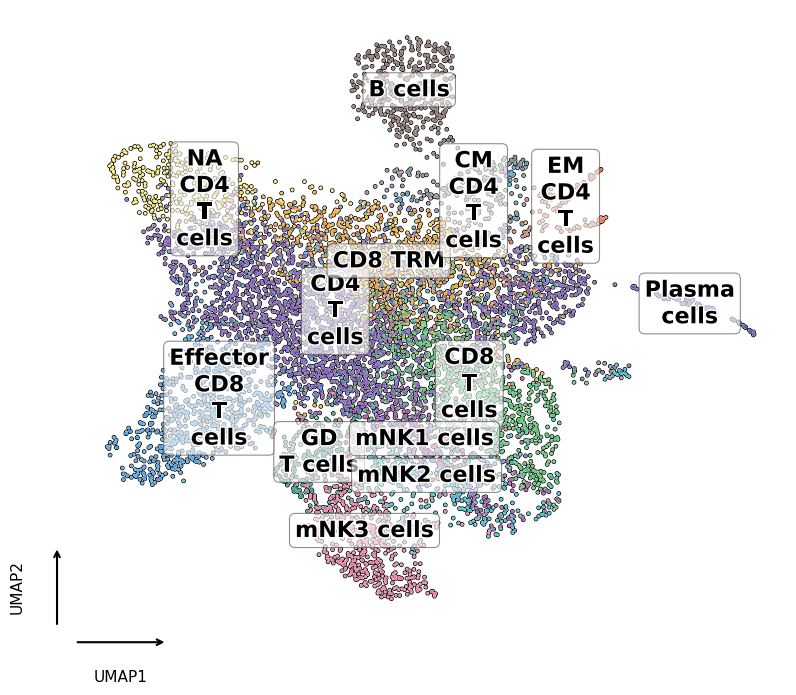

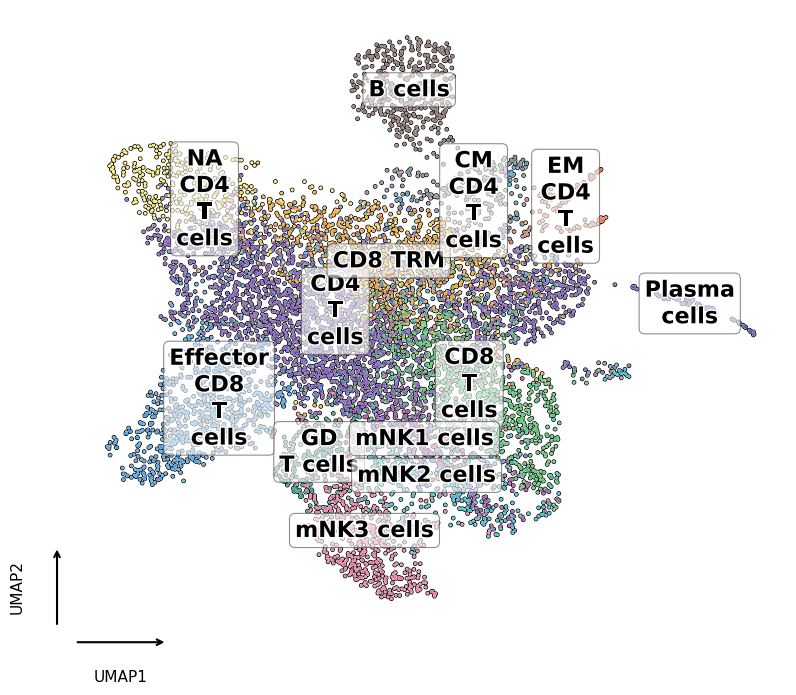

In [155]:
_LABEL_BBOX   = dict(facecolor="white", edgecolor="#444444", linewidth=0.8,
                     boxstyle="round,pad=0.25", alpha=0.6)

plot_umap_celltypes(
    adata_om_lymph,
    celltype_col=ct_col,
    celltype_colors=lymph_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/omentum_celltypes_lymph.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=16,
    point_size=None,
    label_map=lymphoid_pretty_names
)


In [292]:
cell_types_order_lymph

['CD4_T_cells',
 'Effector_CD8_T_cells',
 'CD8_T_cells',
 'CD8_TRM',
 'mNK1_cells',
 'mNK2_cells',
 'mNK3_cells',
 'NA_CD4_T_cells',
 'B_cells',
 'CM_CD4_T_cells',
 'GD_T_cells',
 'EM_CD4_T_cells',
 'Plasma_cells',
 'Tregs',
 'PLCG2_cells',
 'CD4_T_cells']

In [304]:
cell_types_order_lymph_om = [ct for ct in cell_types_order_lymph if ct in adata_om_lymph.obs[ct_col].unique()]
cell_types_order_lymph_om

['CD4_T_cells',
 'Effector_CD8_T_cells',
 'CD8_T_cells',
 'CD8_TRM',
 'mNK1_cells',
 'mNK2_cells',
 'mNK3_cells',
 'NA_CD4_T_cells',
 'B_cells',
 'CM_CD4_T_cells',
 'GD_T_cells',
 'EM_CD4_T_cells',
 'Plasma_cells']

In [470]:
# 'CD8_T_cells':          ['CD8A', ],
#     'Effector_CD8_T_cells': ["CD6", "TIGIT", "LAG3", "GATA3"],
#     'CD8_TRM':              ["IL2", "KLF2", "HAVCR2", "ITGA1"],

sc.tl.rank_genes_groups(
    adata_om_lymph, groupby=ct_col, method="wilcoxon") #, groups=["CD8_TRM"], reference="CD8_T_cells")
ct_col

'cell_type2_'

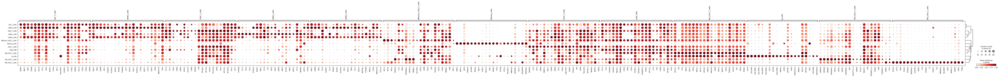

In [472]:
sc.pl.rank_genes_groups_dotplot(adata_om_lymph, groupby=ct_col, standard_scale="var", n_genes=20)

In [475]:
marker_genes_lymph_cell_type = {
    # T cells
    'CD4_T_cells':          ['CD4', "CD3E", "PTPRC"],
    'NA_CD4_T_cells':       ['LEF1'],
    'CM_CD4_T_cells':       ['HLA-DRA', "NR4A1"],
    'EM_CD4_T_cells':       [ 'GZMB'],
    'CD8_T_cells':          ['CD8A', "IFNG"],
    'Effector_CD8_T_cells': [],
    'CD8_TRM':              ["GZMK", "CCL4L2", "LTB",],
    'Tregs':                 ['FOXP3', 'IL2RA', 'CTLA4', 'IKZF2'],
    "PLCG2_cells":           ["PLGC2",],
    'GD_T_cells':            ['TRGC2', 'KLRG1'],
    # NK
    'mNK1_cells':            ['GNLY', 'FCGR3A', 'FCER1G', 'XCL1'],
    'mNK2_cells':            [ ],
    # 'mNK2_cell':             ['XCL1', 'XCL2', 'KIT', 'SELL'],
    'mNK3_cells':            [ 'CX3CR1' ],
    
    "Plasma_cells":          ["JCHAIN"],
    "B_cells":               ["CD79A", ]
}

marker_genes = {
    "T_lineage": ["CD3D", "TRAC"],
    "NK_lineage": ["KLRD1", "NCAM1"],
     # ---- T CELL LINEAGE ----
    "T_cells_general": [
        "CD3D", "CD3E", "TRAC"
    ],

    # ---- CD8 T CELLS ----
    "CD8_effector": [
        "CD8A", "GZMB", "PRF1", "NKG7", "IFNG", "KLRG1", "CX3CR1", "TCF7"
    ],

    "CD8_exhausted": [
        "PDCD1", "LAG3", "TIGIT", "HAVCR2", "TOX"
    ],

    "CD8_TRM_like": [
        "CD69", "CXCR6", "ZNF683", "ITGAE", "RGS1"
    ],

    # ---- CD4 T CELLS ----
    "CD4_effector_memory": [
        "CD4", "IL7R", "CCR6", "CXCR3", "LTB", "CCR7", "SELL", "TCF7", "NR4A1", "ENTPD1"
    ],

    "Treg_adipose": [
        "FOXP3", "IL2RA", "CTLA4", "TNFRSF18", "PPARG"
    ],

    # ---- INNATE / UNCONVENTIONAL T CELLS ----
    "gamma_delta_T": [
        "TRDC", "TRGC1", "TRGC2", "KLRB1", "RORC"
    ],

    "MAIT_cells": [
        "KLRB1", "SLC4A10", "IL18R1", "RORC"
    ],

    # ---- NK CELLS ----
    "NK_cytotoxic": [
        "FCGR3A", "NCAM1", "NKG7", "GNLY", "GZMB"
    ],

    "NK_cytokine_skewed": [
        "NCAM1", "XCL1", "GZMK", "KLRC1", "IL7R"
    ],

    "NK_ILC1_like": [
        "ITGA1", "CXCR6", "TBX21", "EOMES", "ZNF683"
    ],

    # ---- B CELLS ----
    "B_naive": [
        "MS4A1", "IGHD", "TCL1A", "CD79A", "FCER2"
    ],

    "B_memory": [
        "CD27", "MS4A1", "IGHG1", "IGHG3", "BANK1"
    ],

    "Plasma_cells": [
        "XBP1", "PRDM1", "MZB1", "JCHAIN", "SDC1"
    ],

    "CM T cells": ["LEF1", "BACH2", "SATB1", "KLF2"],
    "Cluster 15": ["ITGAE", "CXCR6", "CD69", "ZNF683", "CXCR5", "BCL6", "PDCD1", "ICOS", "MAF", "FOS", "JUN", "EGR1", "CD69", "HLA-DRA", "CD38", "TBX21", "IFNG",   # Th1
 "RORC", "IL17A",   # Th17
 "GATA3", "TOX", "ENTPD1", "LAG3", "TIGIT"]            # Tfh
    # "Additional": ["CCR6", "TIGIT", "KLRB1", "CD2", "CD28", "CRTAM", "GZMB", "GZMH", "IFNG", "KLRC2", "CD200R1", "CD8A", "CD8B", "TRGC2", "FCGR3A", "CD3E", "CD4", "IL7R", "CCL5", "CXCR3", "TBX21", "EOMES", "GATA3", "CCR4", "IL17A", "RORC", "CTSH", "CCL20", "CD200", "TOX", "TOX2", "CXCR5", "ITGB1", "FGFBP2", "GNLY", "CD7", "AREG"],
}

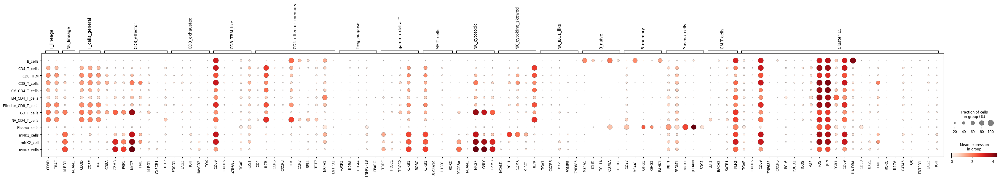

In [379]:
om_lymph_mg = {ct: marker_genes_lymph_cell_type[ct] for ct in cell_types_order_lymph_om[::-1]}

sc.pl.dotplot(adata_om_lymph, var_names=marker_genes, groupby="cell_type1_")

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/1325155747.py:407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


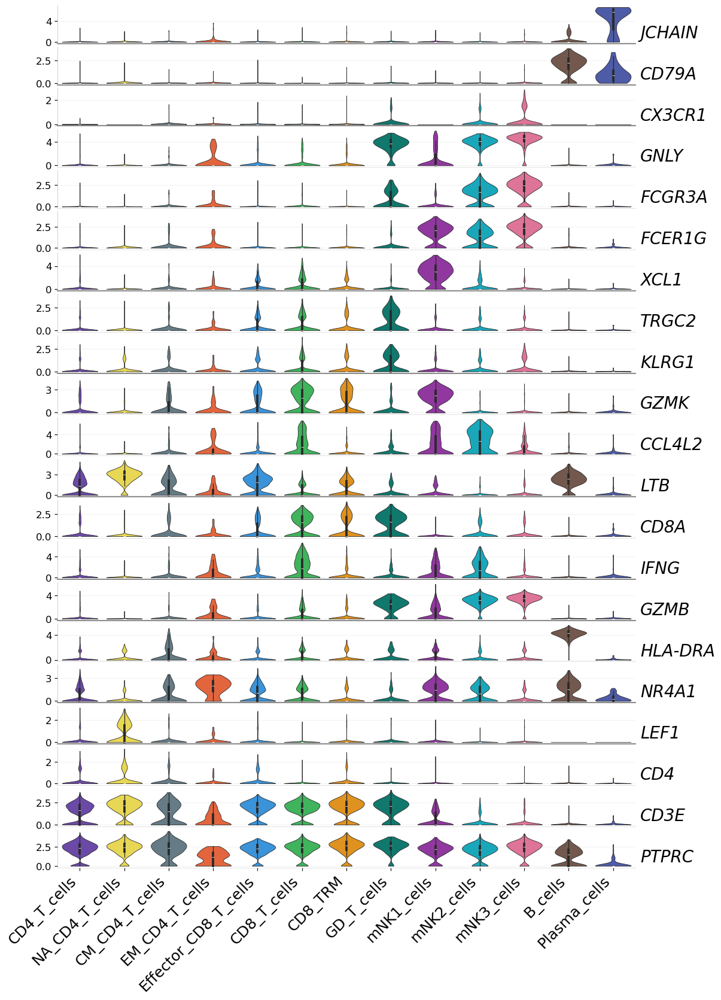

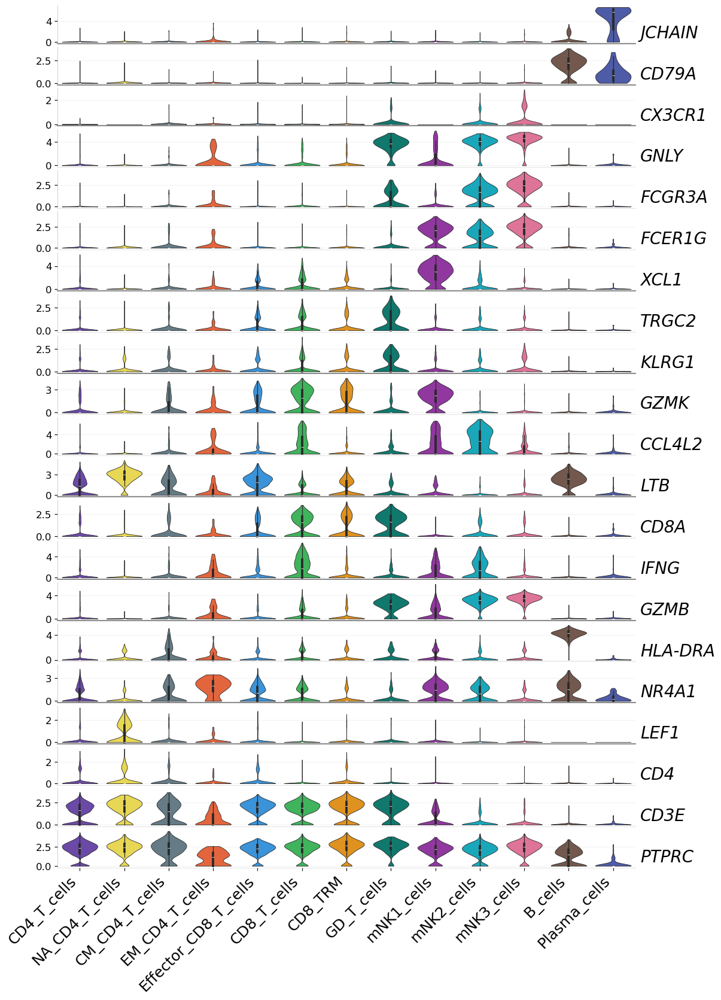

In [476]:
cell_types_order_lymph_om = [ct for ct in cell_types_order_lymph if ct in adata_om_lymph.obs[ct_col].unique()]

plot_marker_violins(
    adata_om_lymph,
    celltype_col = ct_col,
    marker_genes = {ct: marker_genes_lymph_cell_type[ct] for ct in cell_types_order_lymph_om[::-1]},
    celltype_colors = lymph_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/omentum_celltypes_violin_lymph.pdf",
    celltype_order = cell_types_order_lymph_om,
    xlabelsize = 18,
    row_height = 0.75,
)

## SubQ

In [434]:
ct_col = "cell_type2_"
participant_col = "common_participant"

In [435]:
adata = adata_subq[adata_subq.obs[ct_col].isin(cell_types_order_lymph),:].copy()
adata.obs.value_counts(ct_col)

cell_type2_
CD4_T_cells    613
mNK2_cells     321
CD8_T_cells    304
mNK1_cells     293
Tregs           86
PLCG2_cells     76
GD_T_cells      62
B_cells         42
Name: count, dtype: int64

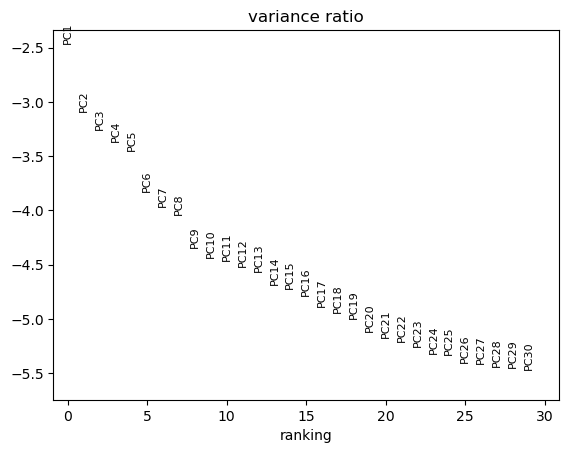

In [436]:
adata.X = adata.layers["counts"].copy()

sc.experimental.pp.recipe_pearson_residuals(adata, batch_key=participant_col, n_comps=30)
sc.pl.pca_variance_ratio(adata, n_pcs=30, log=True)

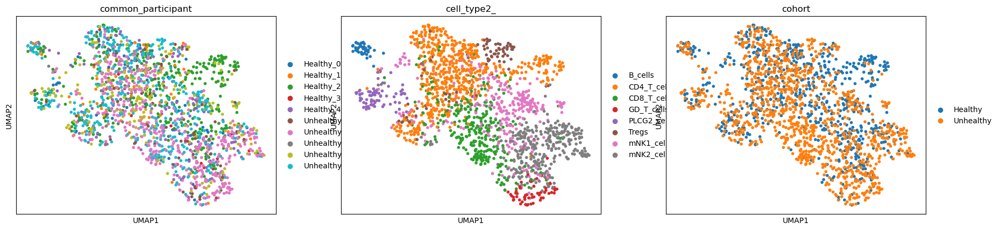

In [40]:
sc.pp.neighbors(adata, n_pcs=30, n_neighbors=15)
sc.tl.umap(adata, )
sc.pl.umap(adata, color=[participant_col, ct_col, "cohort", ])

In [437]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [438]:
adata_subq_lymph = adata.copy()

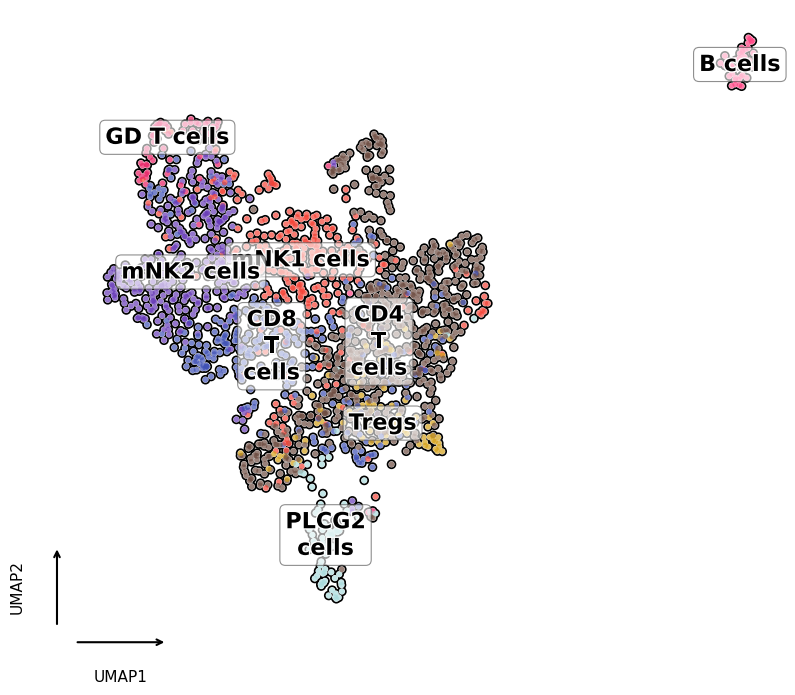

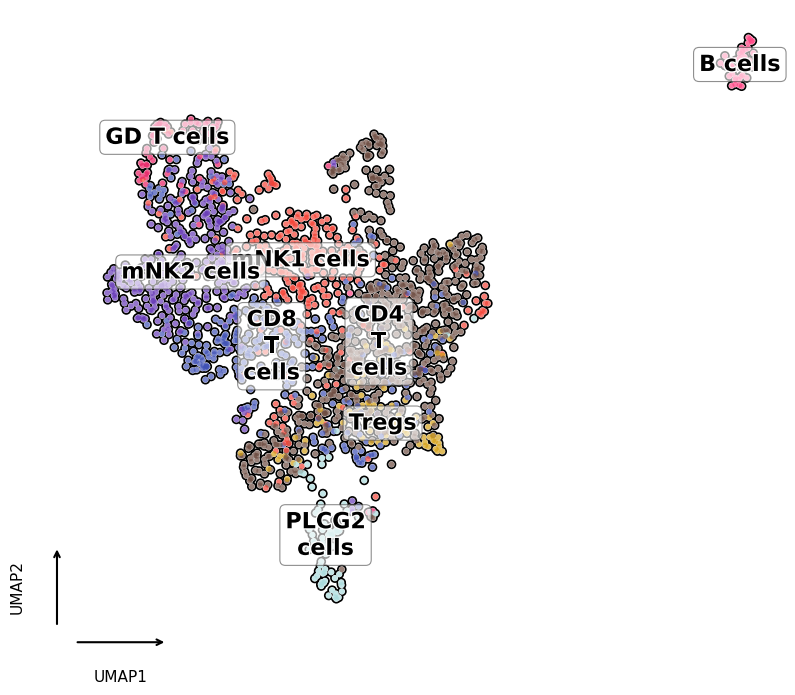

In [45]:
_LABEL_BBOX   = dict(facecolor="white", edgecolor="#444444", linewidth=0.8,
                     boxstyle="round,pad=0.25", alpha=0.6)

plot_umap_celltypes(
    adata_subq_lymph,
    celltype_col=ct_col,
    celltype_colors=lymph_cell_type_colors,
    save_path=f"{OUTPUT_DIR}/omentum_celltypes_lymph.pdf",
    title=None, #"Omentum — cell types",
    legend_loc="on data",
    legend_fontsize=16,
    point_size=None,
    prettify_labels=lymphoid_pretty_names
)


In [463]:
# 'CD8_T_cells':          ['CD8A', ],
#     'Effector_CD8_T_cells': ["CD6", "TIGIT", "LAG3", "GATA3"],
#     'CD8_TRM':              ["IL2", "KLF2", "HAVCR2", "ITGA1"],

sc.tl.rank_genes_groups(
    adata_subq_lymph, groupby=ct_col, method="wilcoxon") #, groups=["CD8_TRM"], reference="CD8_T_cells")
ct_col

'cell_type2_'

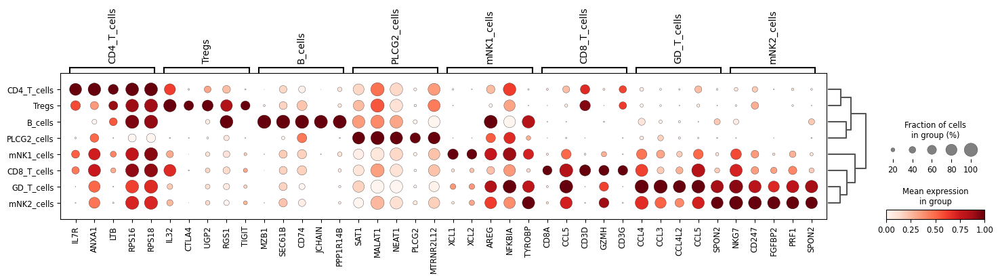

In [465]:
sc.pl.rank_genes_groups_dotplot(adata_subq_lymph, groupby=ct_col, standard_scale="var", n_genes=5)

In [468]:
marker_genes_lymph_cell_type_subq = {
    # T cells
    'CD4_T_cells':          ['CD4', 'IL7R', "CD3E", "PTPRC"],
    'NA_CD4_T_cells':       ['LEF1', "TCF7"],
    'CM_CD4_T_cells':       [],
    'EM_CD4_T_cells':       ['GNLY', 'GZMB','GZMK', 'NKG7', ],
    'CD8_T_cells':          ["IFNG", 'CD8A', ],
    'Effector_CD8_T_cells': ["CD6", "TIGIT", "LAG3", "GATA3"],
    'CD8_TRM':              ["IL2", "KLF2", "HAVCR2", "ITGA1"],
    'Tregs':                 ['FOXP3', 'IL2RA', 'CTLA4',],
    "PLCG2_cells":           ["PLCG2",],
    'GD_T_cells':            ['XCL1', 'XCL2', "TRGC1", "TRDC", ],
    # NK
    'mNK1_cells':            [ "KLRC1"],
    'mNK2_cells':            ["FGFBP2", "PRF1"],
    # 'mNK2_cell':             ['XCL1', 'XCL2', 'KIT', 'SELL'],
    'mNK3_cells':            ['CX3CR1', 'FCGR3A'],
    
    "Plasma_cells":          ["JCHAIN"],
    "B_cells":               ["JCHAIN"]
}

/var/folders/w5/5q2ysxtd5vv9bc1cf7bhf07w0000gn/T/ipykernel_4142/1325155747.py:407: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(


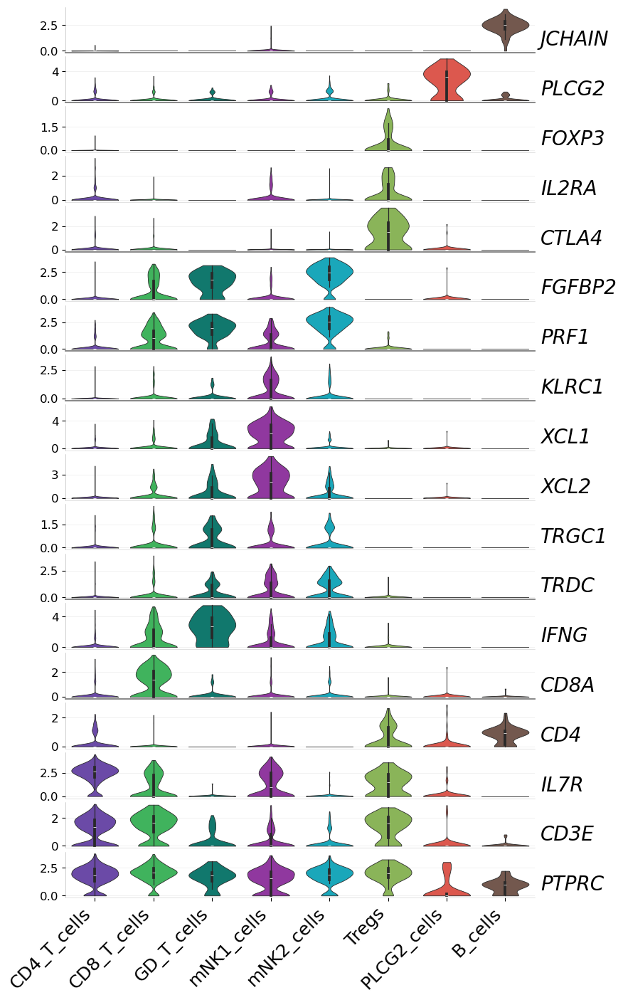

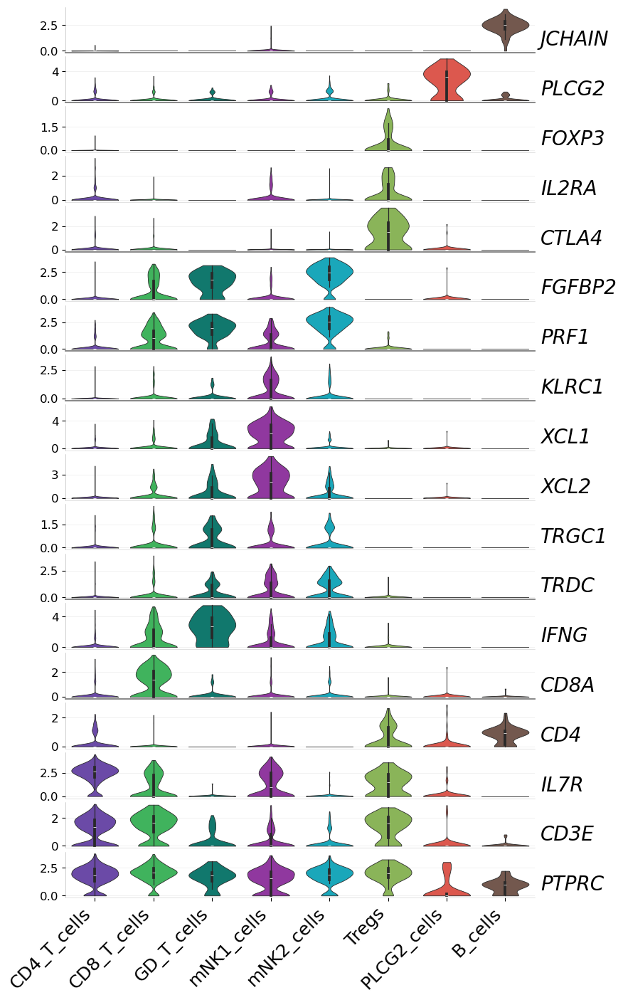

In [469]:
cell_types_order_lymph_subq = [ct for ct in cell_types_order_lymph if ct in adata_subq_lymph.obs[ct_col].unique()]

plot_marker_violins(
    adata_subq_lymph,
    celltype_col = ct_col,
    marker_genes = {ct: marker_genes_lymph_cell_type_subq[ct] for ct in cell_types_order_lymph_subq[::-1]},
    celltype_colors = lymph_cell_type_colors,
    save_path = f"{OUTPUT_DIR}/subq_celltypes_violin_lymph.pdf",
    celltype_order = cell_types_order_lymph_subq,
    xlabelsize = 18,
    row_height = 0.75,
)